In [1]:
#Importing Libraries
#Basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

# Load Clean Dataset

In [2]:
df_new = pd.read_csv('olist_clean.csv', parse_dates = ['order_purchase_timestamp', 'order_delivered_customer_date'])

In [3]:
df_new

,customer_unique_id,customer_city,customer_state,geolocation_lat,geolocation_lng,order_id,order_purchase_timestamp,order_delivered_customer_date,seller_state,product_category_name_english,...,payment_installments,payment_type,payment_value,review_score,order_purchase_date,order_purchase_month_year,order_purchase_month,order_purchase_day,order_purchase_hour,delivery_duration
0,861eff4711a542e4b93843c6dd7febb0,franca,São Paulo,-20.509898,-47.397866,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017-05-25 10:35:35,São Paulo,office_furniture,...,2,credit_card,146.87,4,16,2017-05,5,Tuesday,15,8
1,6741fe058b7a7605920b9060b234294e,franca,São Paulo,-20.509898,-47.397866,98991dc034323e310fdd97b8af6064b0,2018-05-08 12:12:30,2018-05-14 17:58:16,São Paulo,housewares,...,8,credit_card,290.00,5,8,2018-05,5,Tuesday,12,6
2,6741fe058b7a7605920b9060b234294e,franca,São Paulo,-20.509898,-47.397866,98991dc034323e310fdd97b8af6064b0,2018-05-08 12:12:30,2018-05-14 17:58:16,São Paulo,housewares,...,8,credit_card,290.00,5,8,2018-05,5,Tuesday,12,6
3,8d153d12b59d763efeb3953822c51862,franca,São Paulo,-20.509898,-47.397866,0add19297766bc00a177a9ae740554eb,2018-04-01 22:50:57,2018-04-12 13:41:40,São Paulo,health_beauty,...,8,credit_card,314.96,2,1,2018-04,4,Sunday,22,10
4,9a481c845f8bf3fb0b9f4520f11c353e,franca,São Paulo,-20.509898,-47.397866,c23e9a555c327fa1d60893394aae9e9e,2018-03-26 17:29:38,2018-04-03 22:48:58,Paraná,sports_leisure,...,2,credit_card,173.53,4,26,2018-03,3,Monday,17,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112502,35951de17bd7b3325df5c476840fae0f,tres rios,Rio de Janeiro,-22.092675,-43.222227,fce0844e8548aed6d329fd798f4937a9,2017-03-10 13:15:23,2017-03-21 14:37:45,Rio Grande do Sul,books_technical,...,1,boleto,47.78,5,10,2017-03,3,Friday,13,11
112503,584a1dfaa42bc5c9786a3399fe526148,rio de janeiro,Rio de Janeiro,-22.999557,-43.641098,b0cb43bc4638d44188430b7d42b35866,2018-07-31 11:08:37,2018-08-08 16:26:52,Paraná,books_technical,...,1,debit_card,62.21,1,31,2018-07,7,Tuesday,11,8
112504,a6d9bf9bd00ca98f44894adab0578a6f,brasilia,Distrito Federal,-15.824902,-47.892586,37a7476e58da10721b5e55ba4be6807d,2017-12-06 20:22:29,2017-12-12 22:14:31,Distrito Federal,furniture_mattress_and_upholstery,...,5,credit_card,129.16,5,6,2017-12,12,Wednesday,20,6
112505,a6d9bf9bd00ca98f44894adab0578a6f,brasilia,Distrito Federal,-15.824902,-47.892586,37a7476e58da10721b5e55ba4be6807d,2017-12-06 20:22:29,2017-12-12 22:14:31,Distrito Federal,furniture_mattress_and_upholstery,...,5,credit_card,129.17,5,6,2017-12,12,Wednesday,20,6


In [4]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112507 entries, 0 to 112506
Data columns (total 31 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_unique_id             112507 non-null  object        
 1   customer_city                  112507 non-null  object        
 2   customer_state                 112507 non-null  object        
 3   geolocation_lat                112507 non-null  float64       
 4   geolocation_lng                112507 non-null  float64       
 5   order_id                       112507 non-null  object        
 6   order_purchase_timestamp       112507 non-null  datetime64[ns]
 7   order_delivered_customer_date  112507 non-null  datetime64[ns]
 8   seller_state                   112507 non-null  object        
 9   product_category_name_english  112507 non-null  object        
 10  product_name_lenght            112507 non-null  float64       
 11  

In [5]:
df_new['order_purchase_timestamp'] = pd.to_datetime(df_new['order_purchase_timestamp'])
df_new['order_delivered_customer_date'] = pd.to_datetime(df_new['order_delivered_customer_date'])
df_new['order_purchase_month_year'] = df_new['order_purchase_timestamp'].dt.to_period('M')

# Background
## Context
- Kami merupakan `tim data analyst / scientist dari Olist` yang secara khusus ditugaskan untuk `membantu para merchant yang berjualan di Olist meningkatkan revenue mereka`, karena dengan **meningkatnya revenue dari para merchant maka secara tidak langsung juga akan meningkatkan revenue dan popularitas dari Olist itu sendiri**.
- Tujuan utama kami adalah untuk `meneliti perilaku konsumen yang berbelanja di Olist, mencari pola - pola tersembunyi yang bisa dijadikan insight serta rekomendasi bagi para Merchant` untuk mengambil keputusan dalam menjual barang dagangan mereka serta merekomendasikan strategi yang dapat dilakukan untuk `meningkatkan revenue`.
- Selain itu kami juga membangun `Machine Learning` (Product Olist) yang bisa `digunakan oleh para Merchant untuk memperkirakan Revenue yang bisa mereka dapatkan berdasarkan data historis` yang dapat mereka peroleh dengan menginput beberapa `karakteristik barang yang ingin mereka jual`.

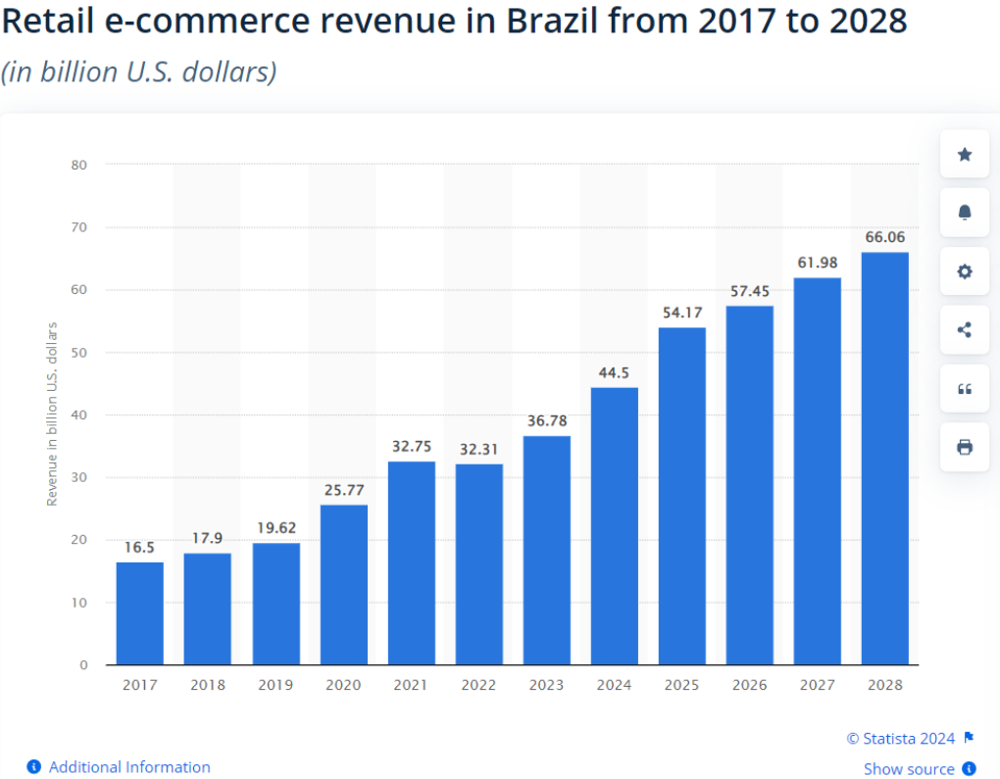

- Berdasarkan data dari Statista Research Department, revenue dari penjualan di E - Commerce Brazil terus mengalami peningkatan setiap tahunnya & prediksinya akan terus berlanjut sampai 2028. Hal ini akan menjadi peluang bagi para pedagang untuk mempromosikan dan menjual barang dagangannya di E - Commerce.
- Tetapi sebelum mencapai pada keuntungan tersebut, ada beberapa hal yang perlu diperhatikan bagi para merchant Olist.

**Source**:
- https://www.statista.com/forecasts/289746/e-commerce-revenue-forecast-in-brazil
- https://www.linkedin.com/advice/1/how-do-you-use-customer-behavior-increase#:~:text=Customer%20behavior%20is%20a%20key%20factor%20in,strategies%20to%20increase%20your%20revenue%20and%20profitability.

## 2017 Data

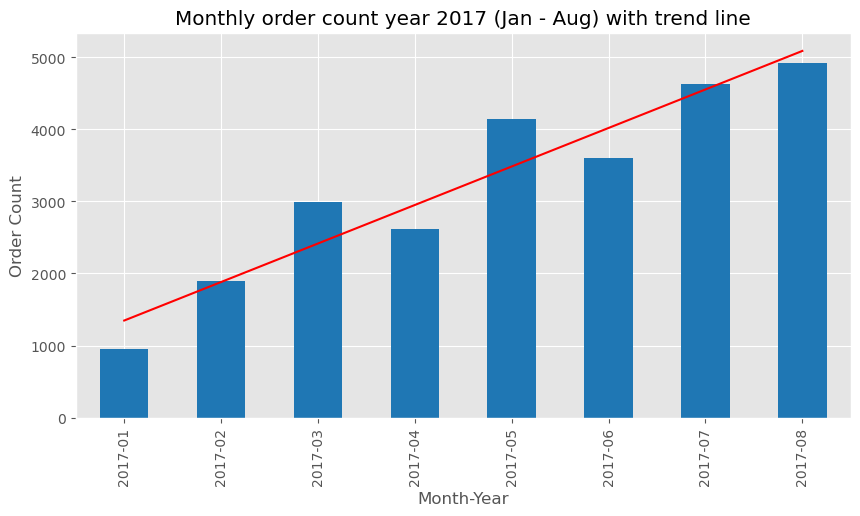

In [6]:
# Monthly order count year 2017 (jan - aug)
order_counts = df_new[(df_new['order_purchase_timestamp'].dt.year == 2017) & (df_new['order_purchase_timestamp'].dt.month < 9)].groupby('order_purchase_month_year').size()

# Calculate linear fit
x = np.array(range(len(order_counts)))
y = order_counts.values
coefficients = np.polyfit(x, y, 1)
poly = np.poly1d(coefficients)

plt.style.use('ggplot')
plt.figure(figsize=(10,5))

# Plot original data
order_counts.plot(kind='bar', color='tab:blue')

# Plot linear fit
plt.plot(x, poly(x), color='red')

plt.title('Monthly order count year 2017 (Jan - Aug) with trend line')
plt.xlabel('Month-Year')
plt.ylabel('Order Count')
plt.show()

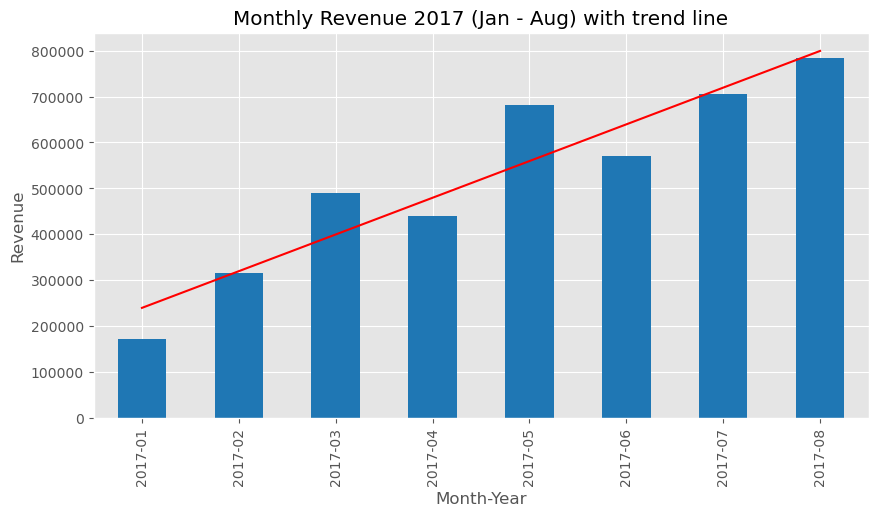

In [7]:
revenue_2017 = df_new[(df_new['order_purchase_timestamp'].dt.year == 2017) & (df_new['order_purchase_timestamp'].dt.month < 9)].groupby('order_purchase_month_year')['payment_value'].sum()

# monthly revenue 2017 with linear fit
x = np.array(range(len(revenue_2017)))
y = revenue_2017.values
coefficients = np.polyfit(x, y, 1)
poly = np.poly1d(coefficients)

plt.figure(figsize=(10,5))

revenue_2017.plot(kind='bar', color='tab:blue')

plt.plot(x, poly(x), color='red')

plt.title('Monthly Revenue 2017 (Jan - Aug) with trend line')
plt.xlabel('Month-Year')
plt.ylabel('Revenue')
plt.show()

## 2018 Data

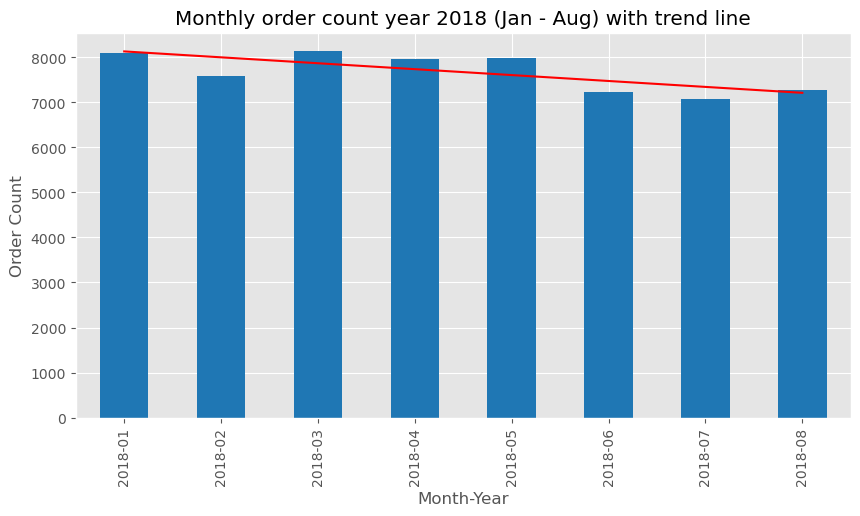

In [8]:
# Monthly order count year 2018 (jan - aug)
order_counts = df_new[(df_new['order_purchase_timestamp'].dt.year == 2018) & (df_new['order_purchase_timestamp'].dt.month < 9)].groupby('order_purchase_month_year').size()

# Calculate linear fit
x = np.array(range(len(order_counts)))
y = order_counts.values
coefficients = np.polyfit(x, y, 1)
poly = np.poly1d(coefficients)

plt.figure(figsize=(10,5))

# Plot original data
order_counts.plot(kind='bar', color='tab:blue')

# Plot linear fit
plt.plot(x, poly(x), color='red')

plt.title('Monthly order count year 2018 (Jan - Aug) with trend line')
plt.xlabel('Month-Year')
plt.ylabel('Order Count')
plt.show()

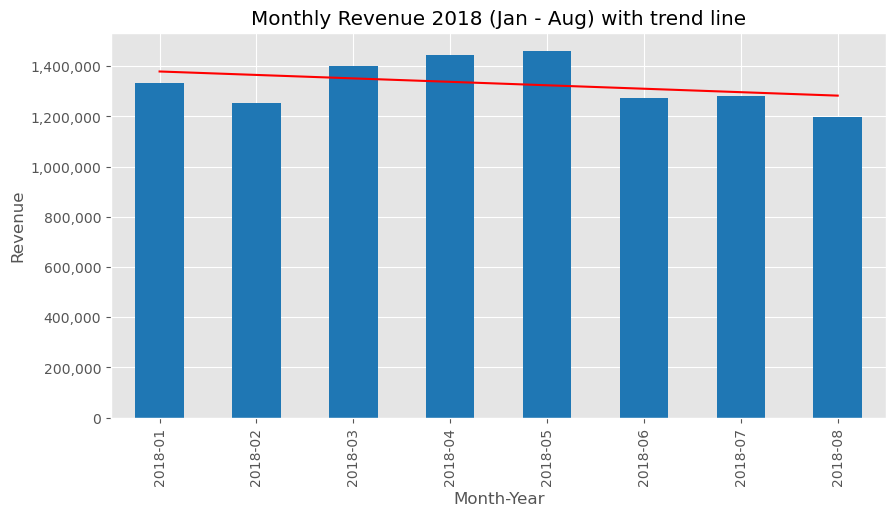

In [9]:
import matplotlib.ticker as mtick

# Monthly revenue 2018
revenue_2018 = df_new[(df_new['order_purchase_timestamp'].dt.year == 2018) & (df_new['order_purchase_timestamp'].dt.month < 9)].groupby('order_purchase_month_year')['payment_value'].sum()

# monthly revenue 2018 with linear fit
x = np.array(range(len(revenue_2018)))
y = revenue_2018.values
coefficients = np.polyfit(x, y, 1)
poly = np.poly1d(coefficients)

plt.figure(figsize=(10,5))

revenue_2018.plot(kind='bar', color='tab:blue')

plt.plot(x, poly(x), color='red')

plt.title('Monthly Revenue 2018 (Jan - Aug) with trend line')
plt.xlabel('Month-Year')
plt.ylabel('Revenue')

# Format y-axis
fmt = '{x:,.0f}'
tick = mtick.StrMethodFormatter(fmt)
plt.gca().yaxis.set_major_formatter(tick)

plt.show()

## 2017 - 2018 (Time Series)

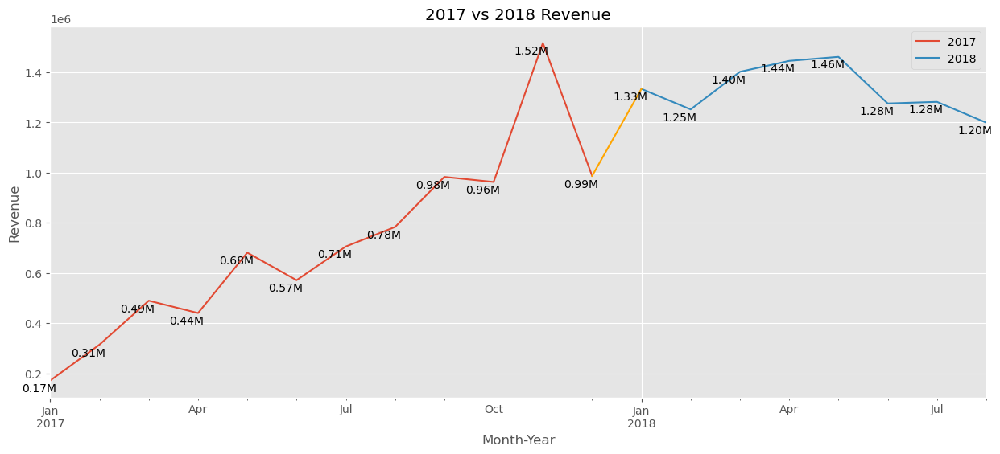

In [10]:
# 2017 vs 2018 revenue

revenue_sum_2017 = df_new[(df_new['order_purchase_timestamp'].dt.year == 2017) & (df_new['order_purchase_timestamp'].dt.month < 13)].groupby('order_purchase_month_year')['payment_value'].sum()

revenue_sum_2018 = df_new[(df_new['order_purchase_timestamp'].dt.year == 2018) & (df_new['order_purchase_timestamp'].dt.month < 9)].groupby('order_purchase_month_year')['payment_value'].sum()

plt.figure(figsize=(15,6))

revenue_sum_2017.plot(kind='line', label='2017')
revenue_sum_2018.plot(kind='line', label='2018')

# Add line from last point of 2017 to first point of 2018
last_point_2017 = revenue_sum_2017[-1]
first_point_2018 = revenue_sum_2018[0]
last_date_2017 = revenue_sum_2017.index[-1]
first_date_2018 = revenue_sum_2018.index[0]
plt.plot([last_date_2017, first_date_2018], [last_point_2017, first_point_2018], color='orange')

# Annotate each point on the line plots
for x, y in zip(revenue_sum_2017.index, revenue_sum_2017.values):
    plt.annotate(f'{y/1000000:.2f}M', (x, y), textcoords="offset points", xytext=(-10,-10), ha='center')
for x, y in zip(revenue_sum_2018.index, revenue_sum_2018.values):
    plt.annotate(f'{y/1000000:.2f}M', (x, y), textcoords="offset points", xytext=(-10,-10), ha='center')

plt.title('2017 vs 2018 Revenue')
plt.xlabel('Month-Year')
plt.ylabel('Revenue')
plt.legend()
plt.show()

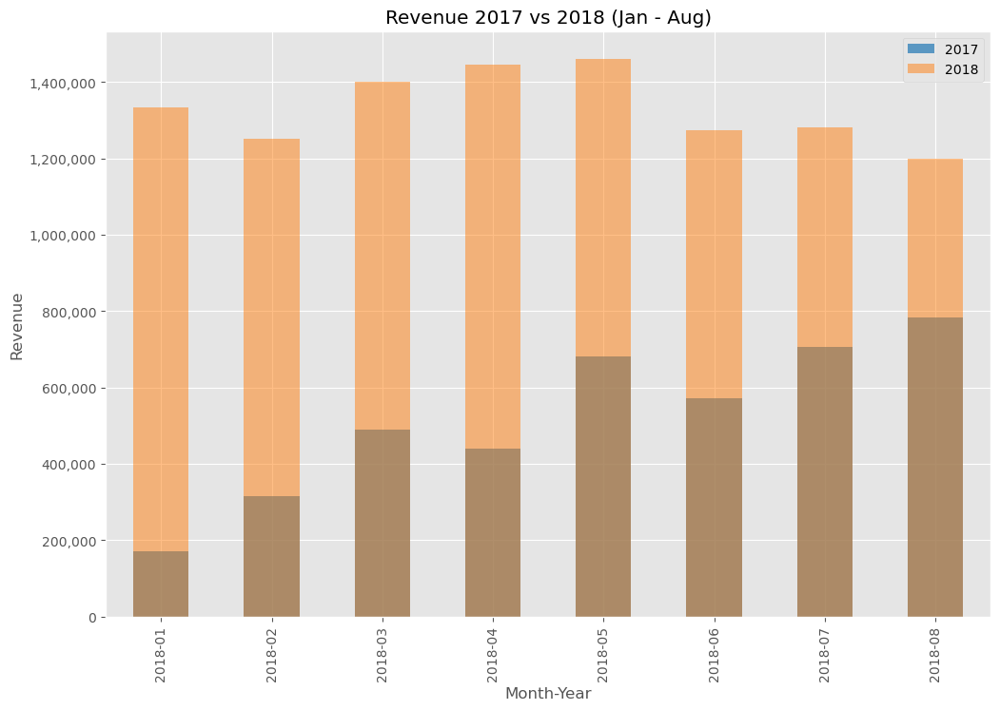

In [11]:
# Revenue 2017 vs 2018 (Jan - Aug), in one bar plot
plt.figure(figsize=(12,8))

revenue_2017.plot(kind='bar', color='tab:blue', alpha=0.7, label='2017')
revenue_2018.plot(kind='bar', color='tab:orange', alpha=0.5, label='2018')

plt.title('Revenue 2017 vs 2018 (Jan - Aug)')
plt.xlabel('Month-Year')
plt.ylabel('Revenue')

# Format y-axis
fmt = '{x:,.0f}'
tick = mtick.StrMethodFormatter(fmt)

plt.gca().yaxis.set_major_formatter(tick)

plt.legend()
plt.show()

- `Jumlah order (order count)` dan `Revenue` **memang mengalami peningkatan jika dibandingkan per bulan antara tahun 2017 dan 2018**.
- tetapi **jumlah order** `pada tahun 2018 trend line menunjukkan trend stagnan bahkan cenderung negatif`, tidak seperti tahun 2017 yang trend linenya sangat positif.
- **Monthly Revenue** `pada tahun 2018 juga menunjukkan trend stagnan bahkan cenderung negatif`, tidak seperti tahun 2017 yang trend linenya sangat positif.
- Bahkan `total revenue per bulannya mengalami penurunan yang sangat drastis semenjak November 2017`.
- Sebagai seorang penjual, kita ingin `growth dari revenue penjualan terus mengalami trend yang positif`.
- Maka dari itu sangat penting untuk menyelidiki dan mengetahui perilaku konsumen dari para pelanggan yang akan sangat berguna untuk mengembangkan strategi `untuk dapat meningkatkan kembali revenue`.

## Audience
- Olist Merchant

## Goals
- Identifikasi Perilaku Konsumen
- Machine Learning (Prediksi Revenue)
- Peningkatan Revenue Merchant
- Menaikkan Traffic Olist

## Questions
- Bagaimana perilaku pembelian dari para customer? (Preferensi Produk, Waktu Pembelian, Rata-Rata Pengeluaran, dll)
- Bagaimana keragaman produk yang terjual di setiap lokasi yang berbeda?
- Bagaimana karakteristik dari setiap produk yang terjual?
- Faktor - Faktor apa saja yang paling berpengaruh terhadap Revenue?

# EDA

## Understanding Customer Demographics

- Pertama akan dilakukan analisis geospasial pada dataset untuk mengidentifikasi wilayah mana di Brazil yang paling sering berbelanja online. Kemudian juga akan dibandingkan wilayah-wilayah tersebut dan diinterpretasikan alasan perbedaan dalam belanja online.
- Dengan membandingkan berbagai wilayah, kita dapat mengidentifikasi perbedaan-perbedaan signifikan dalam penggunaan belanja online.
- Misalnya, mungkin saja wilayah perkotaan besar menunjukkan tingkat aktivitas belanja online yang lebih tinggi dibandingkan dengan wilayah lainnya, yang mungkin dipengaruhi oleh faktor-faktor seperti ketersediaan barang dan layanan, kepadatan penduduk, atau preferensi konsumen.

### Top State with Most Order

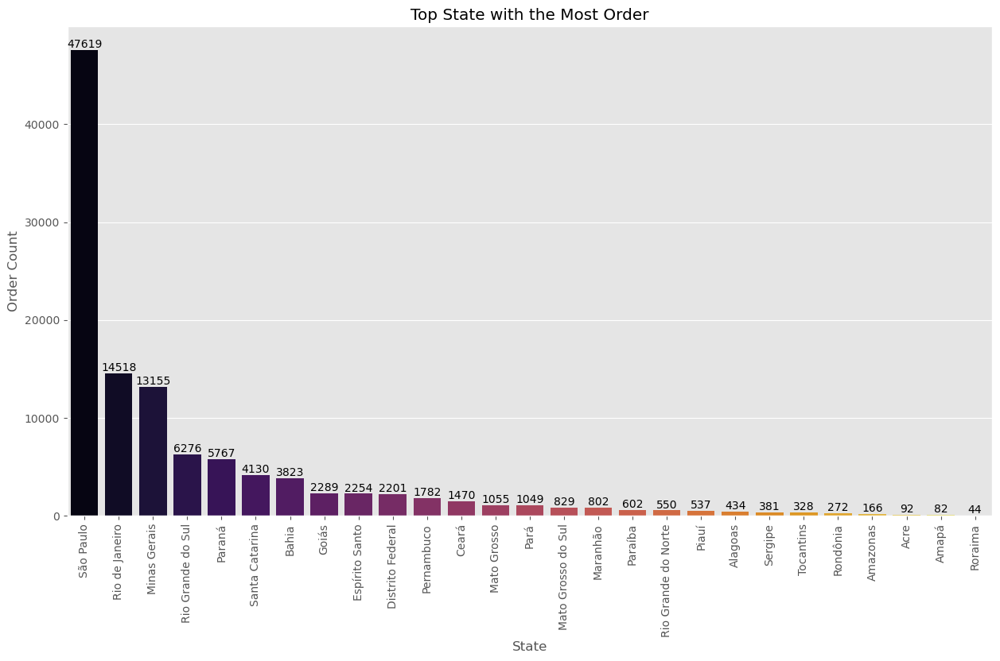

In [12]:
#top state with the most order
top_state_order = df_new['customer_state'].value_counts()

# plot
#ggplot style
plt.style.use('ggplot')
plt.figure(figsize=(15,8))
sns.barplot(x=top_state_order.index, y=top_state_order.values, palette='inferno')
plt.title('Top State with the Most Order')
plt.xlabel('State')
plt.ylabel('Order Count')

# Annotate each bar
for i, v in enumerate(top_state_order.values):
    plt.text(i, v, str(v), ha='center', va='bottom')
    
#Rotate x-labels 45 degrees
plt.xticks(rotation=90)

plt.show()

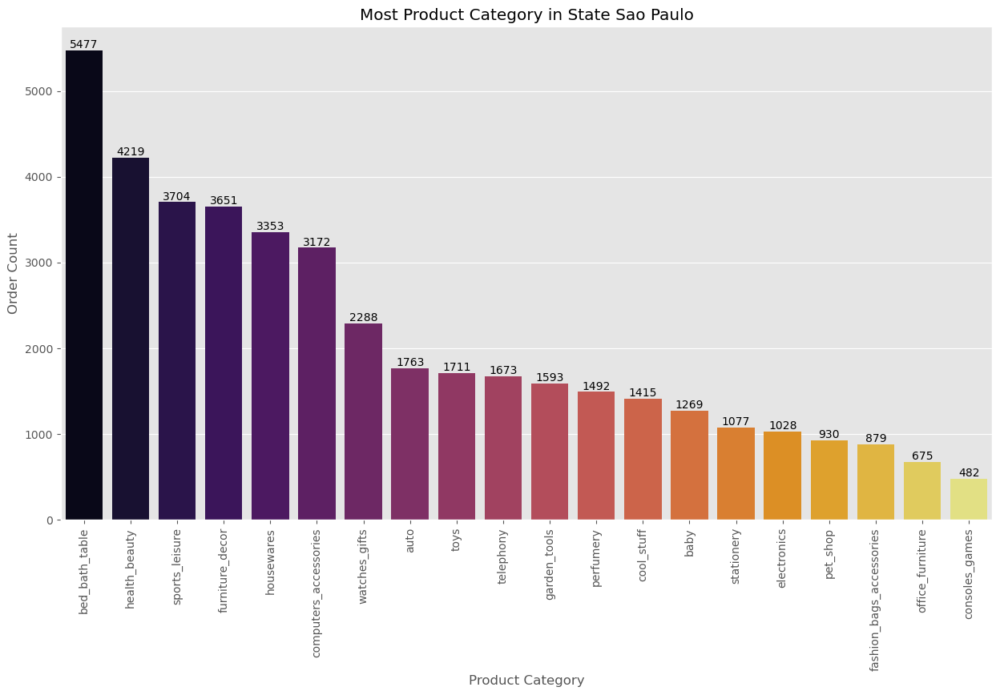

In [13]:
# Most Product Category in State Sau Paulo
# filter the data
sao_paulo = df_new[df_new['customer_state'] == 'São Paulo']
top_category_sao_paulo = sao_paulo['product_category_name_english'].value_counts().head(20)

# plot
plt.figure(figsize=(15,8))
sns.barplot(x=top_category_sao_paulo.index, y=top_category_sao_paulo.values, palette='inferno')
plt.title('Most Product Category in State Sao Paulo')
plt.xlabel('Product Category')
plt.ylabel('Order Count')

# Annotate each bar
for i, v in enumerate(top_category_sao_paulo.values):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.xticks(rotation=90)

plt.show()

- State dengan jumlah pembelanjaan terbanyak ada di `SP (Sau Paulo)`. Ini dikarenakan `Sau Paulo merupakan wilayah metropolitan terpadat di Brasil dan salah satu yang terbesar di dunia`, dengan perkiraan populasi sekitar 21 juta jiwa pada tahun 2022, hampir setengah dari populasi negara Brazil.
- Selain itu `Sao Paulo` dan `Rio de Janeiro` adalah dua kota teratas di Brasil dalam hal jumlah pengguna, hal ini juga bisa didasari karerna `kedua kota tersebut merupakan kota yang paling kaya di Brazil dan memiliki tingkat GRP yang tinggi dibandingkan wilayah lainnya di Brazil`. 
- Analisis ini menunjukkan `faktor ekonomi dalam memengaruhi perilaku belanja online di Brazil`. Wilayah-wilayah yang lebih makmur cenderung memiliki tingkat aktivitas belanja online yang lebih tinggi, sedangkan wilayah-wilayah yang kurang makmur mungkin tidak memiliki aksesibilitas atau daya beli yang cukup untuk melakukan belanja online secara besar-besaran.
- Berikut adalah produk - produk paling populer yang laris terjual di Sau Paulo. `(Bed Bath Table, Health & beauty, Sports & Leisure, Furniture, Housewares, Computers & Accessories, etc)`
- bagi para seller terkhususnya seller yang beroperasi di Sau Paulo dapat menjadikan ini sebagai acuan dalam memilih produk yang ingin dipasarkan.
-  Namun, perlu diingat bahwa karena persaingan yang mungkin ketat di wilayah tersebut, penting bagi seller untuk mengembangkan strategi tambahan guna memastikan keberhasilan bisnis mereka. Untuk menghindari persaingan langsung dengan pesaing, seller dapat memilih untuk memasarkan produk kepada segmen pasar yang spesifik atau memiliki kebutuhan khusus. Misalnya, fokus pada segmen pasar yang mencari produk dengan kualitas premium atau menargetkan segmen pasar yang memprioritaskan pengiriman yang cepat dan efisien.

**Notes**:

"GRP" merupakan kependekan dari "Gross Regional Product", yang dalam bahasa Indonesia dikenal sebagai "Pendapatan Regional Bruto". Jadi, jika dikatakan bahwa Sao Paulo dan Rio de Janeiro memiliki GRP yang tinggi, itu berarti kedua kota tersebut memiliki tingkat pendapatan regional bruto yang besar. Dengan kata lain, keduanya merupakan kota-kota yang memiliki tingkat ekonomi yang kuat dan aktif.
[Sumber Informasi GRP Brazil](https://en.wikipedia.org/wiki/List_of_Brazilian_federative_units_by_gross_regional_domestic_product#:~:text=S%C3%A3o%20Paulo%20is%20the%20richest,ranking%2080th%20and%2055th%20worldwide.)

### Top 5 Product Category Name in 10 State with the Most Order

In [14]:
# take 10 state name
top_state_order = top_state_order[:10]

#take name only make list
top_state_order_name = top_state_order.index.tolist()

In [15]:
# top_state_order_name with top 3 product category name english for each state

# create a new dataframe to store the top 3 product category name english for each state
top_state_order_category = df_new[df_new['customer_state'].isin(top_state_order_name)].groupby('customer_state')['product_category_name_english'].value_counts().groupby('customer_state').head(5)

In [16]:
top_state_order_category = top_state_order_category.to_frame()

# single index
top_state_order_category.reset_index(level=0, inplace=True)
top_state_order_category.reset_index(level=0, inplace=True)

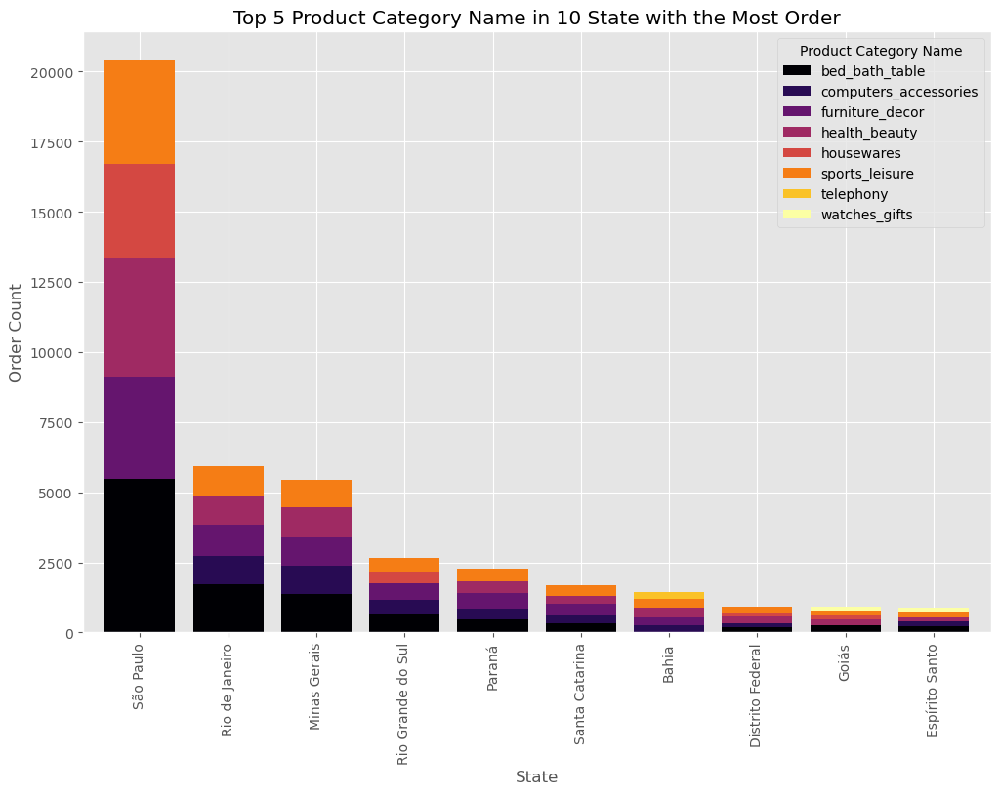

In [17]:
# Pivot the data to get counts for each category in each state
pivot_df = top_state_order_category.pivot(index='customer_state', columns='product_category_name_english', values='count')

# Order the DataFrame by the sum across the rows
pivot_df = pivot_df.reindex(pivot_df.sum(axis=1).sort_values(ascending=False).index)

# Plot
plt.style.use('ggplot')
pivot_df.plot(kind='bar', stacked=True, figsize=(12,8), colormap='inferno', grid=True, width=0.8)

plt.title('Top 5 Product Category Name in 10 State with the Most Order')
plt.xlabel('State')
plt.ylabel('Order Count')
plt.legend(title='Product Category Name')

plt.show()

Dari data yang disajikan, terlihat bahwa **beberapa kategori produk menjadi favorit di setiap negara bagian yang ditampilkan, seperti bed bath table yang muncul di 9 dari 10 negara bagian, furniture decor yang muncul di 7 dari 10 negara bagian, dan sport leisure yang muncul di seluruh negara bagian 10 dari 10 state.** Hal ini menunjukkan bahwa prinsip kuantitatifnya adalah fokus pada produk-produk dalam kategori yang diminati secara luas di seluruh negara bagian, yang sebelumnya telah direkomendasikan. Dengan mempertimbangkan popularitas kategori produk ini di berbagai negara bagian, penjual dapat menggunakan informasi ini sebagai panduan dalam memilih produk yang ingin dijual. Penjual juga perlu memprioritaskan memasarkan produk-produk dalam kategori yang populer seperti bed bath table, furniture decor, dan sport leisure di negara bagian dengan jumlah pesanan terbanyak, seperti São Paulo, Rio de Janeiro, dan lainnya, untuk meningkatkan penjualan dan memanfaatkan permintaan pasar yang tinggi.

Fokus pada negara bagian dengan volume pesanan tinggi seperti São Paulo (SP), Rio de Janeiro (RJ), Minas Gerais (MG), dan lainnya, dapat mengakibatkan persaingan di pasar dapat menjadi lebih ketat. Dalam hal ini, penjual perlu mempersiapkan strategi tambahan untuk tetap bersaing secara efektif. Salah satu strategi lain yang bisa diterapkan selain fokus pada segmen pasar tertentu adalah diferensiasi produk, di mana penjual dapat menawarkan produk dengan fitur unik atau nilai tambah yang tidak tersedia di pasaran lainnya. Selain itu, penjual juga dapat memperkuat branding dan citra merek mereka untuk menarik perhatian pelanggan potensial. 

### Top Cities with the Most Order

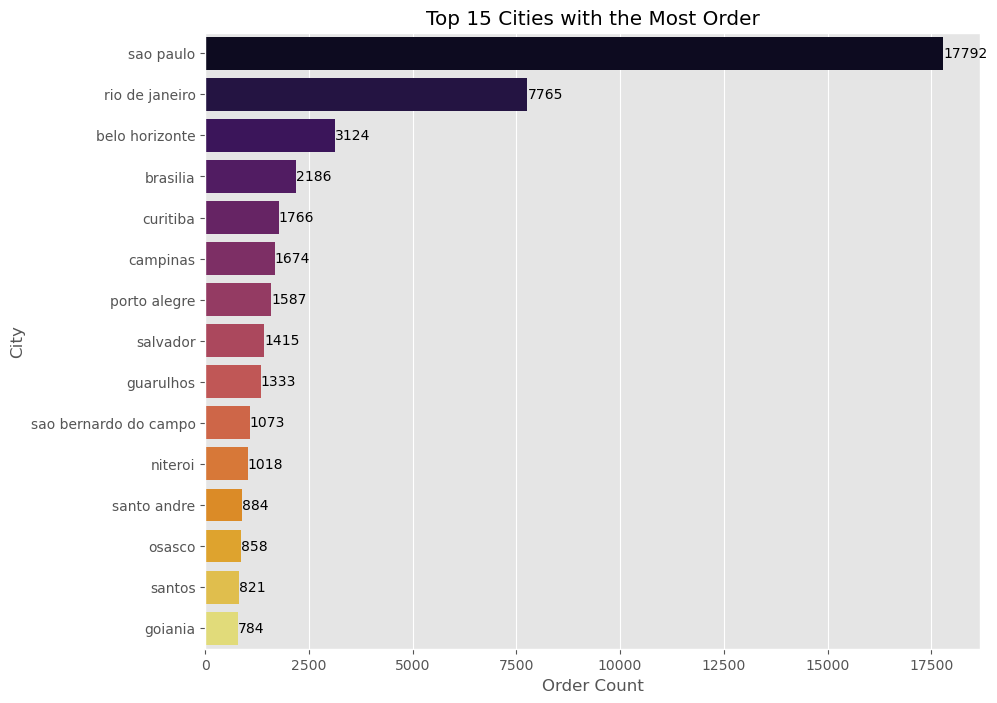

In [18]:
# Count the number of orders for each city
city_order_counts = df_new['customer_city'].value_counts()

# Get the top 10 cities with the most orders
top_15_cities = city_order_counts.head(15)

# Plot
plt.style.use('ggplot')
plt.figure(figsize=(10,8))
sns.barplot(y=top_15_cities.index, x=top_15_cities.values, palette='inferno')
plt.title('Top 15 Cities with the Most Order')
plt.xlabel('Order Count')
plt.ylabel('City')

# Annotate each bar
for i, v in enumerate(top_15_cities.values):
    plt.text(v, i, str(v), ha='left', va='center')

plt.show()

In [19]:
# Check top_15_cities state
top_15_cities_state = df_new[df_new['customer_city'].isin(top_15_cities.index)].groupby('customer_city')['customer_state'].unique()

top_15_cities_state.to_frame()

,customer_state
customer_city,
belo horizonte,[Minas Gerais]
brasilia,[Distrito Federal]
campinas,[São Paulo]
curitiba,[Paraná]
goiania,[Goiás]
guarulhos,[São Paulo]
niteroi,[Rio de Janeiro]
osasco,[São Paulo]
porto alegre,[Rio Grande do Sul]


In [20]:
#top 10 cities with the most orders and the top 3 product category name english for each city

# create a new dataframe to store the top 3 product category name english for each city
top_city_order_category = df_new[df_new['customer_city'].isin(top_15_cities.index)].groupby('customer_city')['product_category_name_english'].value_counts().groupby('customer_city').head(5)

top_city_order_category = top_city_order_category.to_frame()

# single index
top_city_order_category.reset_index(level=0, inplace=True)
top_city_order_category.reset_index(level=0, inplace=True)

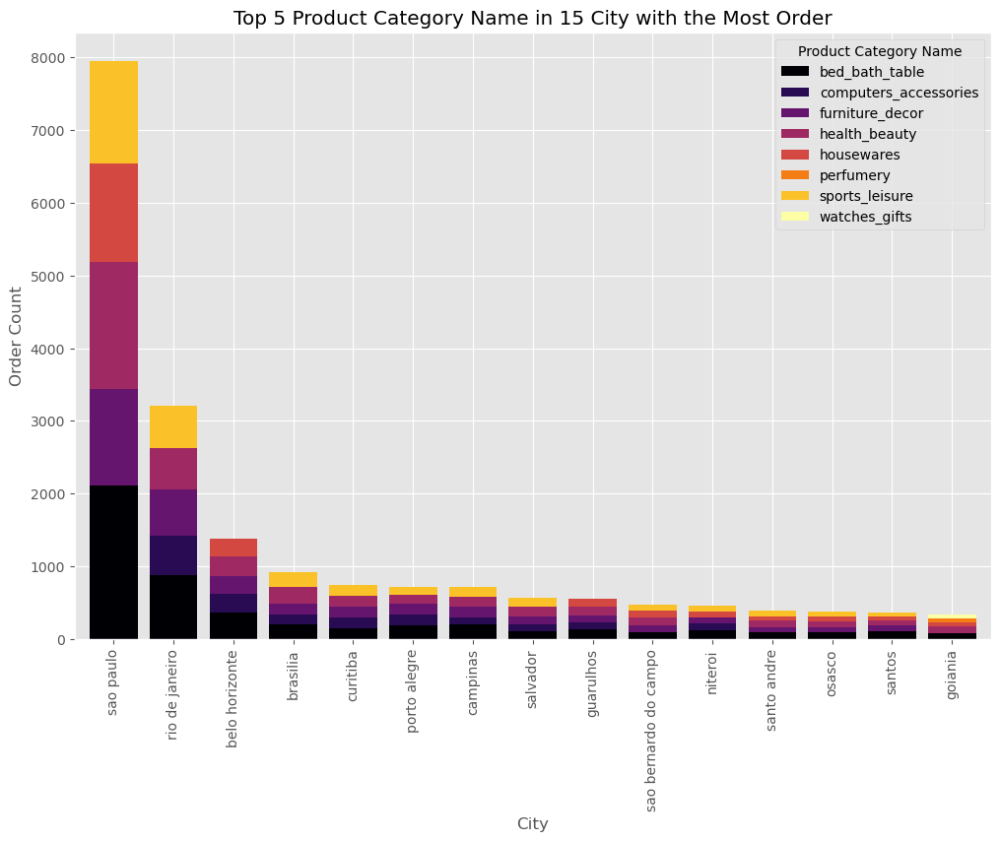

In [21]:
# Pivot the data to get counts for each category in each city
pivot_df = top_city_order_category.pivot(index='customer_city', columns='product_category_name_english', values='count')

# Order the DataFrame by the sum across the rows
pivot_df = pivot_df.reindex(pivot_df.sum(axis=1).sort_values(ascending=False).index)

# Plot
plt.style.use('ggplot')
pivot_df.plot(kind='bar', stacked=True, figsize=(12,8), colormap='inferno', grid=True, width=0.8)

plt.title('Top 5 Product Category Name in 15 City with the Most Order')
plt.xlabel('City')
plt.ylabel('Order Count')
plt.legend(title='Product Category Name')

plt.show()

Dari data yang disajikan, dapat dilihat bahwa kota-kota dengan jumlah pesanan terbanyak memang terletak di negara bagian yang telah disebutkan sebelumnya. **São Paulo (SP) memimpin dengan sekitar 53%** dari total pesanan dengan top produknya bed bath table, furniture decor, health and beauty, houseware dan sport, diikuti oleh **Rio de Janeiro (RJ) dengan 21% dari total pesanan** dengan top productnya yaitu bed bath table, computer accessories, health beauty furniture decor, dan watches gift, dan **Belo Horizonte (BH) dengan sekitar 9% dari total pesanan** dimana top 5 productnya adalah  bed bath table, computer accessories, health beauty, furniture decor, dan houseware. Sementara itu, **kota-kota lainnya memiliki pesanan kurang dari 1000, yang masing-masing menyumbang kurang dari 7% dari total pesanan** dengan produk populernya yaitu bed bath table, computer accessories, health beauty. Dengan mempertimbangkan persentase pesanan yang tinggi di kota-kota ini, penjual dapat menggunakan informasi ini sebagai acuan dalam memilih produk yang ingin dijual dengan tambahan strategi yang telah diberikan sebelumnya

### Top 5 City in Each State with The Most Order

In [22]:
# top 5 city in each state with the most order
top_5_city = df_new.groupby(['customer_state', 'customer_city']).size().groupby('customer_state').nlargest(5).reset_index(level=0, drop=True).reset_index()

top_5_city.columns = ['customer_state', 'customer_city', 'order_count']

In [23]:
# Group df_new by 'customer_state', 'customer_city', and 'product_category_name_english' and calculate the size of each group
product_counts = df_new.groupby(['customer_state', 'customer_city', 'product_category_name_english']).size()

# For each 'customer_state' and 'customer_city', find the 'product_category_name_english' with the largest size
most_ordered_product = product_counts.groupby(['customer_state', 'customer_city']).idxmax().apply(lambda x: x[2])

# Merge this information back into the top_5_city DataFrame
top_5_city = top_5_city.set_index(['customer_state', 'customer_city'])
top_5_city['most_ordered_product'] = most_ordered_product
top_5_city = top_5_city.reset_index()

In [24]:
# Add the count of the most ordered product
top_5_city['most_ordered_product_count'] = top_5_city.set_index(['customer_state', 'customer_city', 'most_ordered_product']).index.map(product_counts)

# Reset the index
top_5_city = top_5_city.reset_index()

In [25]:
#delete the index column
top_5_city = top_5_city.drop(columns='index')

In [26]:
top_5_city

,customer_state,customer_city,order_count,most_ordered_product,most_ordered_product_count
0,Acre,rio branco,78,furniture_decor,12
1,Acre,brasileia,3,computers_accessories,3
2,Acre,cruzeiro do sul,3,christmas_supplies,1
3,Acre,senador guiomard,3,housewares,2
4,Acre,xapuri,2,baby,1
...,...,...,...,...,...
127,Tocantins,palmas,122,health_beauty,21
128,Tocantins,araguaina,39,telephony,7
129,Tocantins,gurupi,29,perfumery,6
130,Tocantins,paraiso do tocantins,13,computers_accessories,4


- Untuk lebih detailnya `berikut kami sediakan 5 Kota Teratas di Setiap Negara Bagian dengan Pesanan Terbanyak`.
- Dari data yang disediakan, terlihat bahwa **setiap negara bagian memiliki preferensi produknya masing-masing, yang tidak hanya terbatas pada negara bagian dengan jumlah pesanan terbanyak**. Fokus pada preferensi produk yang berbeda-beda di setiap negara bagian, yang sebelumnya telah direkomendasikan. Dengan mempertimbangkan preferensi produk yang berbeda di masing-masing negara bagian, penjual dapat menggunakan informasi ini sebagai panduan dalam menyesuaikan penawaran produk mereka. Seller dapat memprioritaskan memasarkan produk-produk yang sesuai dengan preferensi pelanggan di setiap negara bagian sesuai dengan lokasi seller, yang dapat ditemukan melalui analisis preferensi produk di kota-kota teratas di setiap negara bagian. Dengan cara ini, penjual dapat meningkatkan daya tarik produk mereka dan meningkatkan potensi penjualan di pasar lokal.

### Brazil Map

In [27]:
import folium
from folium.plugins import HeatMap, FastMarkerCluster
from folium.features import DivIcon

m = folium.Map(location=[df_new['geolocation_lat'].mean(), df_new['geolocation_lng'].mean()], zoom_start=6, tiles='cartodbdark_matter')

all_data = df_new[['geolocation_lat', 'geolocation_lng']].copy()
all_data['order_count'] = 1

heat_data = [[row['geolocation_lat'], row['geolocation_lng']] for index, row in df_new.iterrows()]
HeatMap(heat_data, fill_opacity=-1).add_to(m)

state_coordinates = df_new.groupby('customer_state')[['geolocation_lat', 'geolocation_lng']].mean().reset_index()

locations = list(zip(all_data['geolocation_lat'], all_data['geolocation_lng'], all_data['order_count']))
FastMarkerCluster(locations).add_to(m)

for index, row in state_coordinates.iterrows():
    folium.Marker(
        location=[row['geolocation_lat'], row['geolocation_lng']], 
        icon=DivIcon(
            icon_size=(76,36),  # Make the width and height the same
            icon_anchor=(-10,18),  # Adjust the anchor point to be in the center of the icon
            html='<div style="font-size: 10pt; color : black; background-color: white; border: 1px solid black; padding: 5px; text-align: center;"><b>{}</b></div>'.format(row['customer_state']),
        )
    ).add_to(m)

# Add circle for Sao Paulo
sao_paulo_coordinates = state_coordinates[state_coordinates['customer_state'] == 'São Paulo'].iloc[0]
folium.Circle(
    location=[sao_paulo_coordinates['geolocation_lat'], sao_paulo_coordinates['geolocation_lng']],
    radius=600 * 1000,  # Convert KM to meters
    fill=True,
    fill_opacity=0.5
).add_to(m)
    
m

Dari peta yang ditampilkan di atas, kami memperoleh bahwa `wilayah tenggara Brasil memiliki jumlah pesanan tertinggi melalui e-commerce.` Ada beberapa faktor lainnya yang dapat menjelaskan mengapa wilayah tenggara Brazil menjadi pusat pesanan e-commerce yang utama:

* **Keberagaman Ekonomi**: Wilayah ini memiliki keberagaman ekonomi yang besar, dengan sektor-sektor seperti industri, perdagangan, jasa, dan pariwisata yang berkembang pesat. Hal ini menciptakan kondisi yang mendukung pertumbuhan e-commerce, karena ada beragam kebutuhan dan preferensi konsumen yang harus dipenuhi.
* **Infrastruktur Digital yang Baik**: Kota-kota besar di wilayah ini memiliki infrastruktur digital yang baik, termasuk akses internet yang cepat dan luas, serta penetrasi smartphone yang tinggi. Ini memudahkan penduduk untuk mengakses platform e-commerce dan melakukan pembelian secara online dengan mudah.
* **Kehidupan Urban yang Aktif**: Kota-kota seperti Sao Paulo dan Rio de Janeiro memiliki kehidupan urban yang sibuk dan dinamis, di mana orang-orang cenderung sibuk dengan pekerjaan dan kegiatan sosial. Oleh karena itu, belanja online menjadi pilihan yang lebih praktis dan efisien bagi banyak penduduk untuk memenuhi kebutuhan mereka tanpa harus menghabiskan waktu dan tenaga untuk berbelanja di toko fisik.
* **Promosi dan Penawaran Khusus**: Sebagai pusat kegiatan ekonomi dan perdagangan, wilayah tenggara Brasil sering menjadi target promosi dan penawaran khusus dari perusahaan e-commerce. Ini termasuk diskon, program loyalitas, dan promosi musiman seperti Black Friday, yang mendorong konsumen untuk melakukan lebih banyak pembelian online.

## Analyzing Order and Product Characteristics:

### Product Performance

In [28]:
# Group the data by product category and calculate the median of the price column and the mean of the order_quantity and review_score columns
average_data = df_new.groupby('product_category_name_english').agg({
    'price': 'median',
    'order_quantity': 'mean',
    'review_score': 'mean'
})

# Rename the columns for clarity
average_data.columns = ['Median Price', 'Average Order Item', 'Average Review Score']

average_data = average_data.sort_values('Median Price', ascending=False)

average_data.head(15)

,Median Price,Average Order Item,Average Review Score
product_category_name_english,,,
computers,1100.000,1.155660,4.221698
small_appliances_home_oven_and_coffee,750.000,1.013333,4.453333
agro_industry_and_commerce,268.450,1.256098,4.227642
furniture_bedroom,169.000,1.176471,3.941176
security_and_services,141.645,1.000000,2.500000
office_furniture,139.990,1.505172,3.551149
air_conditioning,139.990,1.221453,4.051903
la_cuisine,129.000,1.133333,4.133333
cool_stuff,129.000,1.075155,4.189308


Dari tabel tersebut, terlihat bahwa **harga tertinggi dimiliki oleh kategori produk "computers" sebesar 1100, yang dapat menunjukkan bahwa produk-produk dalam kategori ini cenderung memiliki nilai jual yang lebih tinggi**. Sementara itu, **kategori "small_appliances_home_oven_and_coffee" memiliki rata-rata skor review tertinggi sebesar 4.45, menandakan bahwa produk-produk dalam kategori ini cenderung mendapatkan penilaian yang positif dari pelanggan**. Seller dapat memperhatikan potensi keuntungan yang lebih tinggi dengan menjual produk dalam kategori "computers" yang memiliki harga rata-rata yang lebih tinggi. Dengan demikian, penjual dapat mengoptimalkan penawaran produk mereka untuk meningkatkan kepuasan pelanggan dan potensi penjualan.

### Correlation

#### Product Characteristics and Revenue

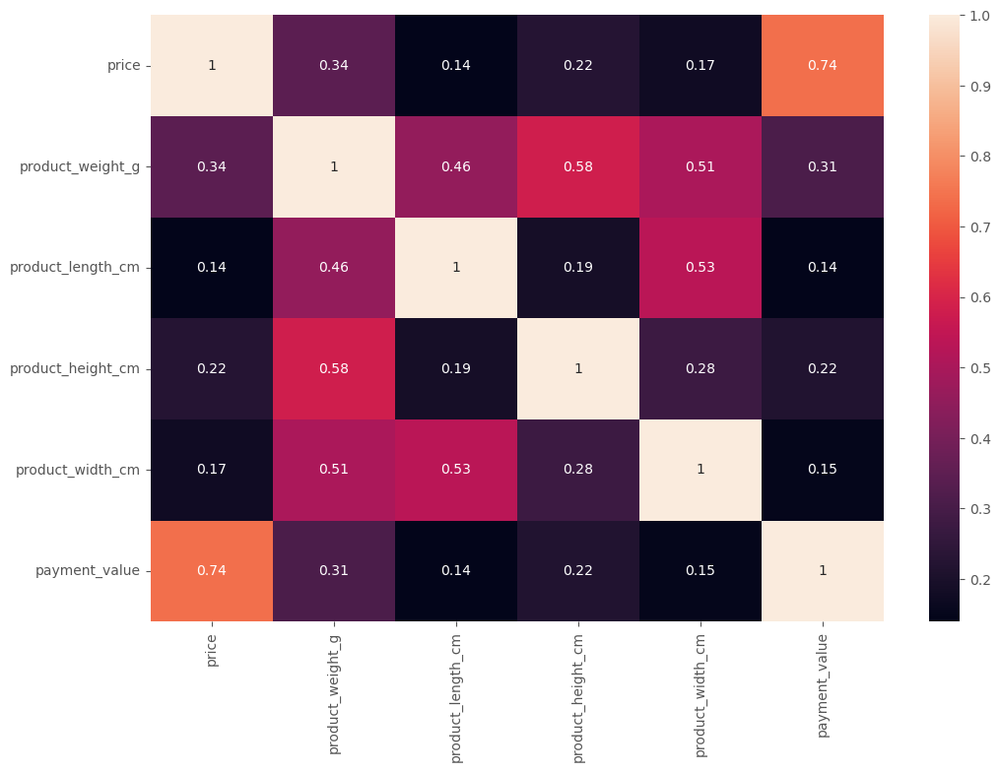

In [29]:
# Step 1: Create a new DataFrame
df_analysis = df_new[['price', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'payment_value']]

# Step 2: Calculate the correlation matrix
corr_matrix = df_analysis.corr()

# Step 3: Visualize the correlation matrix
plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True)
plt.show()

Dari data yang disajikan, terlihat bahwa **harga barang memiliki korelasi yang kuat dan positif terhadap pendapatan yaitu sebesar 0.74, yang mengikuti prinsip kuantitatif bahwa semakin tinggi harga barang, semakin tinggi pendapatan yang dihasilkan**. Selain itu, berat barang juga memiliki korelasi yang positif sebesar 0.31 terhadap pendapatan, menunjukkan bahwa semakin berat suatu produk, semakin tinggi pendapatan yang dihasilkan. Meskipun dimensi barang lainnya juga memiliki korelasi positif terhadap pendapatan sebesar 0.14, 0.15 dan 0.22, namun tidak terlalu signifikan dibandingkan dengan harga dan berat barang yang memiliki nilai 0.31. Penjual dapat mempertimbangkan untuk menetapkan harga yang lebih tinggi untuk barang-barang yang lebih berat, dengan memperhatikan korelasi antara harga, berat, dan pendapatan. Dengan cara ini, penjual dapat mengoptimalkan strategi penetapan harga mereka untuk meningkatkan pendapatan mereka secara efektif.

#### Store Pages and Revenue

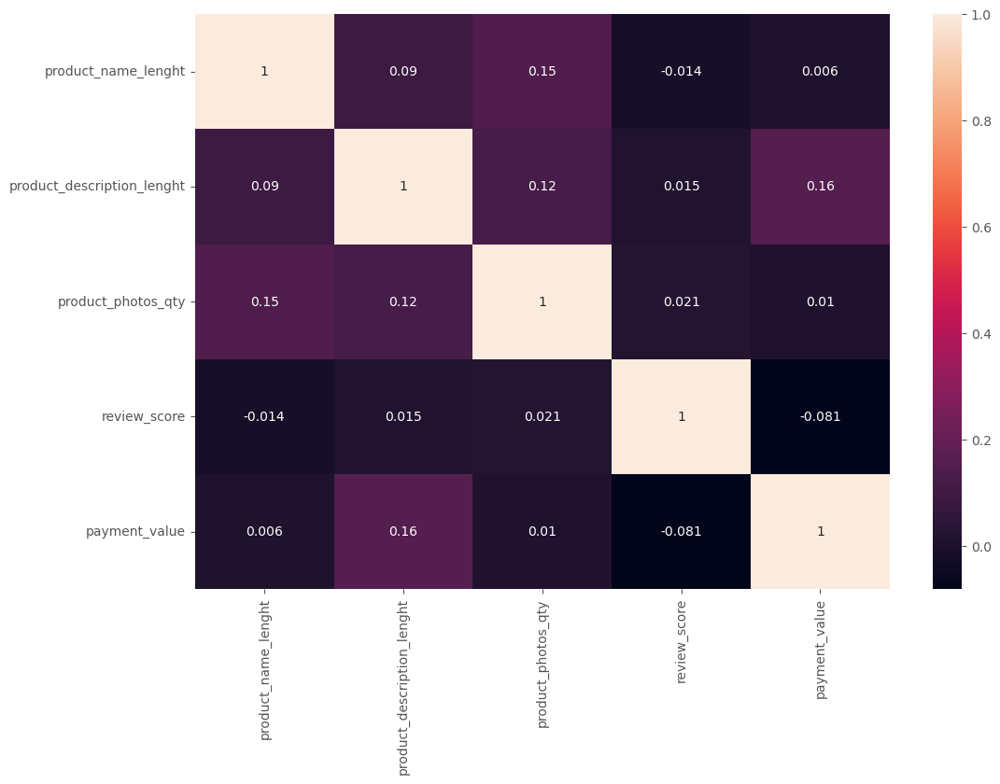

In [30]:
# Step 1: Create a new DataFrame
df_analysis = df_new[['product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'review_score', 'payment_value']]

# Step 2: Calculate the correlation matrix
corr_matrix = df_analysis.corr()

# Step 3: Visualize the correlation matrix
plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True)
plt.show()

**Deskripsi produk yang detail dan informatif memiliki pengaruh terhadap pendapatan penjualan di halaman produk sebesar 0.16.** Hal ini karena calon pembeli cenderung lebih percaya pada penjual yang menyediakan deskripsi produk yang lengkap dan mendetail. Meskipun jumlah foto dan panjang judul produk juga penting, namun tidak memiliki pengaruh yang signifikan terhadap pendapatan. Namun, hal yang perlu diperhatikan adalah bahwa review score memiliki korelasi negatif dengan pendapatan, yang berarti bahwa penilaian yang baik dari pelanggan dapat meningkatkan pendapatan toko. Berdasarkan prinsip kuantitatifnya, penjual dapat meningkatkan pendapatan dengan menyediakan deskripsi produk yang detail, memperhatikan kualitas foto, dan memastikan bahwa produk mendapatkan penilaian yang baik dari pelanggan. Tindakan yang dapat diambil adalah memperbarui deskripsi produk dengan informasi yang lebih lengkap, meningkatkan kualitas foto produk, dan memastikan pelayanan yang memuaskan agar mendapatkan ulasan positif dari pelanggan.

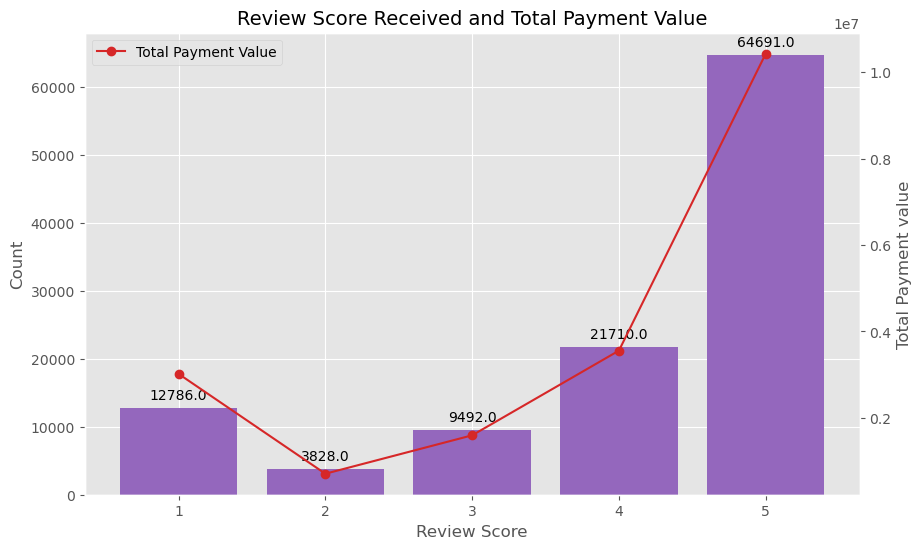

In [31]:
# Calculate total revenue for each review score
df_revenue = df_new.groupby('review_score')['payment_value'].sum().reset_index()

# Convert 'review_score' to categorical type with the same categories as in df_new
df_revenue['review_score'] = pd.Categorical(df_revenue['review_score'], categories=df_new['review_score'].unique(), ordered=True)

# Create the count plot
plt.figure(figsize=(10,6))
ax1 = plt.gca()
ax1.bar(df_new['review_score'].value_counts().index, df_new['review_score'].value_counts().values, color='tab:purple')
plt.title('Review Score Received and Total Payment Value',fontsize=14)
plt.xlabel('Review Score',fontsize=12)
plt.ylabel('Count',fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Hide the grid
ax1.grid(True)
ax2 = ax1.twinx()
ax2.grid(False)

# Add labels with adjustments
for p in ax1.patches:
    ax1.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

# Create a second y-axis for the revenue line chart
ax2.plot(df_revenue['review_score'], df_revenue['payment_value'], color='tab:red', label='Total Payment Value', marker='o')
ax2.set_ylabel('Total Payment value',fontsize=12)

# Add a legend
ax2.legend(loc='upper left')

plt.show()

**Sebagian besar ulasan cenderung memberikan rating yang tinggi, dengan skor ulasan paling umum adalah 5 bintang dan jumlah ulasan yang diberikan dengan rating 2 bintang paling sedikit.** Hal ini menunjukkan bahwa distribusi ulasan cenderung condong ke arah positif, di mana lebih banyak pelanggan yang cenderung memberikan ulasan yang baik daripada yang buruk. Fenomena ini mungkin terjadi karena orang cenderung lebih termotivasi untuk memberikan ulasan ketika mereka puas dengan pengalaman mereka menggunakan produk atau layanan tertentu. Dalam konteks ini, ulasan yang baik dapat meningkatkan reputasi toko dan produk, yang pada gilirannya dapat meningkatkan kepercayaan pelanggan dan memengaruhi keputusan pembelian mereka. Tindakan yang dapat diambil oleh penjual adalah meningkatkan kualitas produk dan layanan yang ditawarkan untuk memastikan kepuasan pelanggan, serta mendorong pelanggan untuk memberikan ulasan positif melalui pengalaman belanja yang menyenangkan dan pelayanan yang memuaskan.

## Exploring Purchase Behavior Over Time

### Seasonality

#### Month

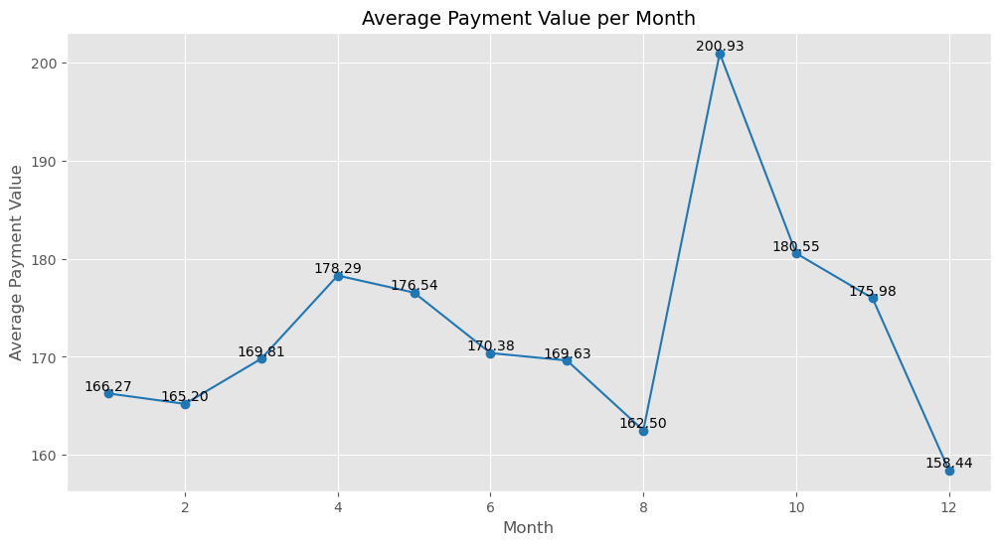

In [32]:
import matplotlib.cm as cm

# Calculate total payment value for each month
df_payment = df_new.groupby('order_purchase_month')['payment_value'].mean().reset_index()

# Create Line Chart
plt.figure(figsize=(12,6))
plt.plot(df_payment['order_purchase_month'], df_payment['payment_value'], marker='o', color='tab:blue')
plt.title('Average Payment Value per Month', fontsize=14)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Average Payment Value', fontsize=12)

# Add grid
plt.grid(True)

# Annotation
for x, y in zip(df_payment['order_purchase_month'], df_payment['payment_value']):
    plt.text(x, y, f'{y:.2f}', ha='center', va='bottom')
    
plt.show()

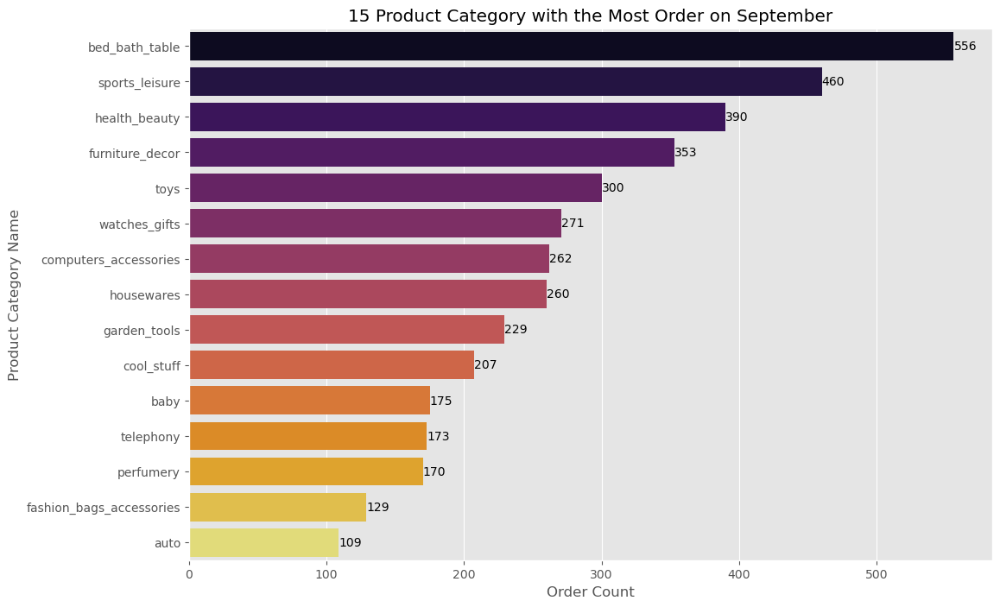

In [33]:
# 15 Product Category Name with the Most Order on Month 5 (May) to Month 8 (August)
top_15_product_category = df_new[(df_new['order_purchase_month'] > 8) & (df_new['order_purchase_month'] < 10)]['product_category_name_english'].value_counts().head(15)

# Plot
plt.figure(figsize=(12,8))
sns.barplot(x=top_15_product_category.values, y=top_15_product_category.index, palette='inferno')
plt.title('15 Product Category with the Most Order on September')
plt.xlabel('Order Count')
plt.ylabel('Product Category Name')

# Annotate each bar
for i, v in enumerate(top_15_product_category.values):
    plt.text(v, i, str(v), ha='left', va='center')

plt.show()

- Terdapat fluktuasi dalam rata-rata nilai pembayaran dari bulan ke bulan, tetapi secara umum terlihat bahwa nilai pembayaran cenderung berada dalam kisaran yang relatif stabil.
- Pembelian terbanyak ada di rentang bulan September, hal ini bisa disebabkan oleh beberapa hal:
    - Adanya libur tahunan untuk memperingati `hari kemerdekaan Brazil pada tanggal 7 September`.
    - Event tahunan seperti `Setembro Negro Festival`, yakni festival musik metal tahunan yang diadakan di São Paulo, Brasil.
- Bagi para seller akan sangat penting untuk mengelola stok dari barang yang akan dijual pada bulan - bulan ini, karena bulan ini merupakan `peak season`.
- Beberapa produk yang laris terjual di antara bulan Mei sampai Agustus diantaranya adalah: `Bed Bath Table, Health & beauty, Sports & Leisure, Furniture, Housewares, Computers & Accessories, Watches & Gifts, etc`.
- Selain itu moment seperti ini bisa juga dijadikan ajang untuk mengadapakan beberapa promosi khusus.

**Source**:
- https://tumbaproductions.com.br/site/eng-index/#setembro-negro
- https://en.wikipedia.org/wiki/Independence_Day_(Brazil)#:~:text=The%20Independence%20Day%20of%20Brazil,Algarves%20on%207%20September%201822.

#### Day and Hour

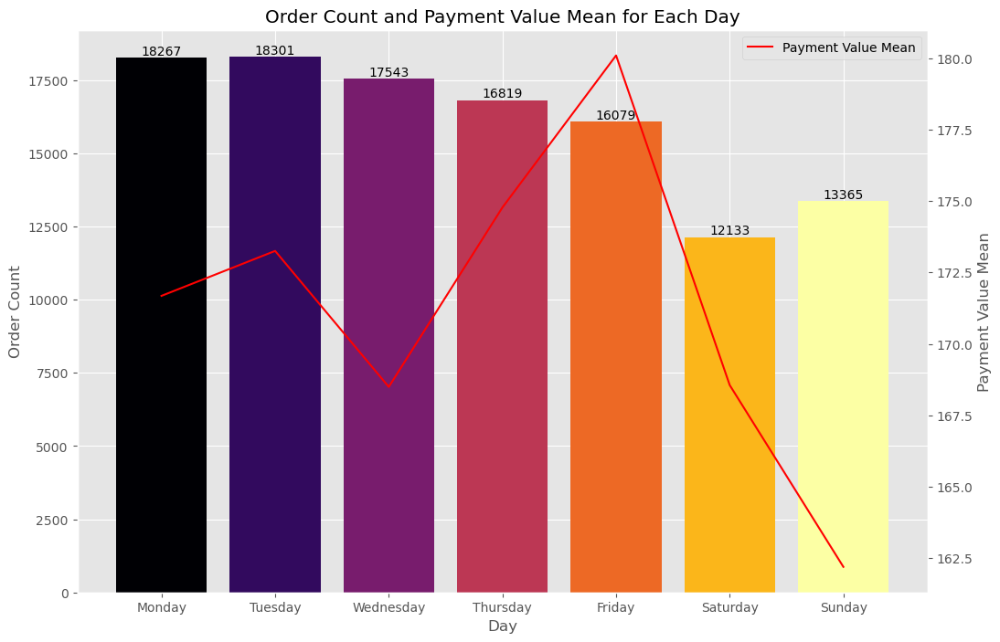

In [34]:
import matplotlib.cm as cm

# Calculate total payment value for each day
df_payment_day = df_new.groupby('order_purchase_day')['payment_value'].mean().reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']).reset_index()

# Create bar plot for order count for each day
plt.figure(figsize=(12,8))
ax1 = plt.gca()

# Create a colormap from the 'inferno' palette
cmap = cm.get_cmap('inferno')

# Map each day of the week to a unique number
day_to_num = {'Monday': 1, 'Tuesday': 2, 'Wednesday': 3, 'Thursday': 4, 'Friday': 5, 'Saturday': 6, 'Sunday': 7}
df_new['day_num'] = df_new['order_purchase_day'].map(day_to_num)

# Normalize the unique day numbers to range between 0 and 1
norm = plt.Normalize(min(day_to_num.values()), max(day_to_num.values()))

# Order the counts for each day
counts = df_new['order_purchase_day'].value_counts().reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Create the bars with colors from the 'inferno' palette
bars = ax1.bar(counts.index, counts.values, color=cmap(norm([day_to_num[day] for day in counts.index])))

plt.title('Order Count and Payment Value Mean for Each Day')
plt.xlabel('Day')
plt.ylabel('Order Count')

# Show the grid
ax1.grid(True)

# Annotate each bar
for bar in bars:
    yval = bar.get_height()
    ax1.annotate(yval,
                 (bar.get_x() + bar.get_width() / 2, yval),
                 ha='center', va='bottom')

# Create a second y-axis for the total payment value line chart
ax2 = ax1.twinx()
ax2.plot(df_payment_day['order_purchase_day'], df_payment_day['payment_value'], color='red', label='Payment Value Mean')
ax2.set_ylabel('Payment Value Mean')

# Hide the grid for the second y-axis
ax2.grid(False)

# Add a legend
ax2.legend(loc='upper right')

plt.show()

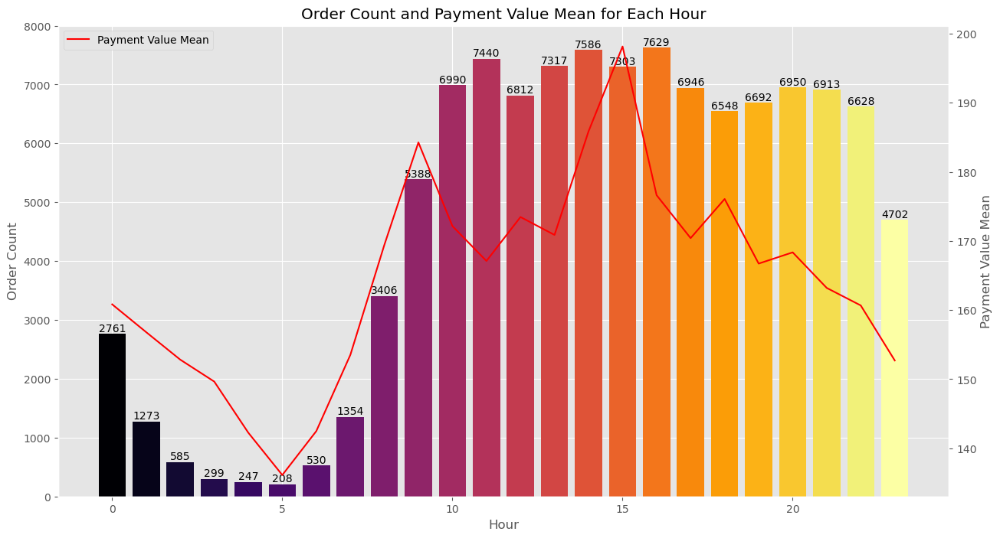

In [35]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# Hour with the most order
df_new['order_purchase_hour'] = df_new['order_purchase_timestamp'].dt.hour

# Calculate total payment value for each hour
df_payment_hour = df_new.groupby('order_purchase_hour')['payment_value'].mean().reset_index()

# Create a bar plot for order count for each hour
plt.figure(figsize=(15,8))
ax1 = plt.gca()

# Create a colormap from the 'inferno' palette
cmap = cm.get_cmap('inferno')

# Normalize the hour values to range between 0 and 1
norm = Normalize(df_new['order_purchase_hour'].min(), df_new['order_purchase_hour'].max())

# Create the bars with colors from the 'inferno' palette
bars = ax1.bar(df_new['order_purchase_hour'].value_counts().sort_index().index, df_new['order_purchase_hour'].value_counts().sort_index().values, color=cmap(norm(df_new['order_purchase_hour'].value_counts().sort_index().index)))

plt.title('Order Count and Payment Value Mean for Each Hour')
plt.xlabel('Hour')
plt.ylabel('Order Count')

# Annotate each bar
for bar in bars:
    yval = bar.get_height()
    ax1.annotate(yval,
                 (bar.get_x() + bar.get_width() / 2, yval),
                 ha='center', va='bottom')

# Create a second y-axis for the total payment value line chart
ax2 = ax1.twinx()
ax2.plot(df_payment_hour['order_purchase_hour'], df_payment_hour['payment_value'], color='red', label='Payment Value Mean')
ax2.set_ylabel('Payment Value Mean')

# Hide the grid for the second y-axis
ax2.grid(False)

# Add a legend
ax2.legend(loc='upper left')

plt.show()

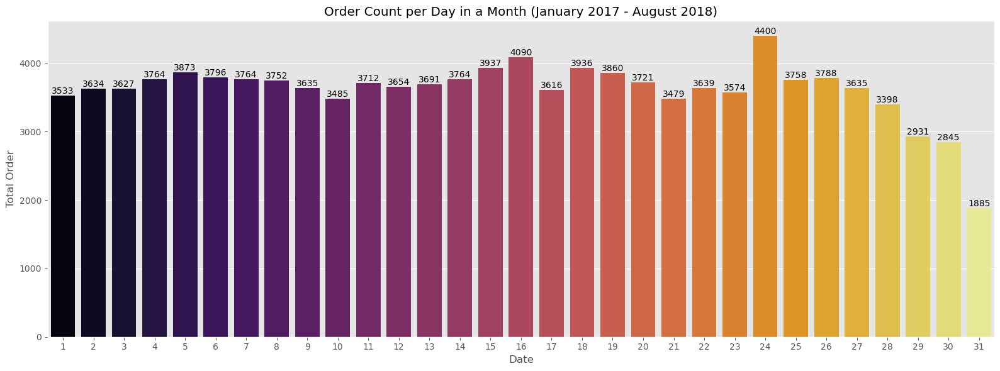

In [36]:
# Filter data untuk rentang waktu yang diinginkan (Januari 2017 hingga Agustus 2018)
df_filtered = df_new[(df_new['order_purchase_timestamp'] >= '2017-01-01') & (df_new['order_purchase_timestamp'] <= '2018-08-31')]

df_filtered['day_of_month'] = df_filtered['order_purchase_timestamp'].dt.day        # Ubah format tanggal untuk memperoleh tanggal dalam sebulan
order_per_day = df_filtered.groupby('day_of_month').size()                          # Hitung jumlah pesanan per hari dalam sebulan

# Plot grafik
plt.figure(figsize=(16, 6))
sns.barplot(x=order_per_day.index, y=order_per_day.values, palette='inferno')
plt.title('Order Count per Day in a Month (January 2017 - August 2018)')
plt.xlabel('Date')
plt.ylabel('Total Order')
plt.xticks(rotation=0)  # Rotasi label sumbu x untuk meningkatkan keterbacaan
plt.xticks(range(0, 31), range(1, 32))  # Menampilkan hanya label tanggal dari 1 hingga 31
plt.tight_layout()  # Menyesuaikan layout agar tidak terpotong

#Annotate each bar
for i, v in enumerate(order_per_day):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.show()

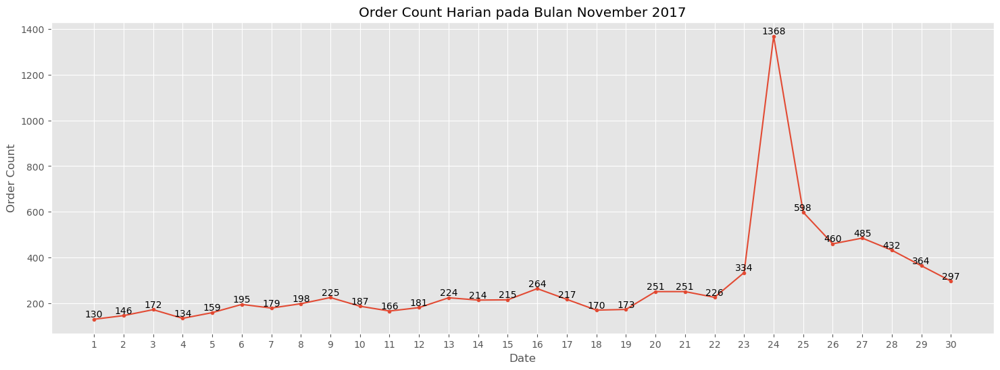

In [37]:
df_november = df_new[df_new['order_purchase_month_year'] == '2017-11']                               # Filter data untuk hanya transaksi yang terjadi pada bulan November
orders_per_date = df_november['order_purchase_timestamp'].dt.day.value_counts().sort_index()        # Hitung jumlah transaksi pada setiap tanggal di bulan November

plt.style.use('ggplot')

# Plot grafik
plt.figure(figsize=(18, 6))
orders_per_date.plot(kind='line', marker='o', markersize=3, grid=True)
plt.title('Order Count Harian pada Bulan November 2017')
plt.xlabel('Date')
plt.ylabel('Order Count')
plt.grid(True)

# Menambahkan label pada setiap titik dengan ukuran font yang diatur
for i in range(len(orders_per_date)):
    plt.text(orders_per_date.index[i], orders_per_date.values[i], str(orders_per_date.values[i]), ha='center', va='bottom', fontsize=10)

plt.xticks(range(1, len(orders_per_date)+1), labels=orders_per_date.index)
plt.show()

- Dari analisis tersebut, terlihat bahwa para **pelanggan cenderung lebih aktif berbelanja pada hari kerja dibandingkan dengan akhir pekan, dengan jam paling aktif antara pukul 10 pagi hingga 8 malam**. Oleh karena itu, para admin E-Commerce diharapkan untuk aktif melakukan pengecekan dan memberikan dukungan pada hari dan jam tersebut, untuk memastikan pengalaman berbelanja yang lebih baik bagi para pelanggan.
- Selain itu, puncak pesanan terjadi pada tanggal 24, khususnya pada tanggal 24 November 2017 yang bertepatan dengan [Black Friday](https://www.independent.co.uk/news/world/black-friday-2017-brazil-shoppers-discount-sales-brazil-south-africa-a8073651.html) di Brazil, di mana terdapat 1368 pelanggan yang melakukan pesanan. Hal ini menunjukkan pentingnya mengadakan promosi pada acara-acara tertentu, terutama yang bersifat tahunan, untuk meningkatkan penjualan dan menarik minat pelanggan.
- Insight actionable dari temuan ini adalah bahwa para penjual perlu memperhatikan pola belanja pelanggan berdasarkan hari, jam, dan tanggal tertentu, serta memanfaatkan acara-acara besar seperti Black Friday untuk meningkatkan penjualan dan kepuasan pelanggan.

## Payment & Freight

### Payment Type Distribution

In [38]:
# Step 1: Create a new DataFrame
df_payment = df_new[['payment_type', 'payment_installments', 'payment_value', 'product_category_name_english']]

df_payment['order_count'] = 1

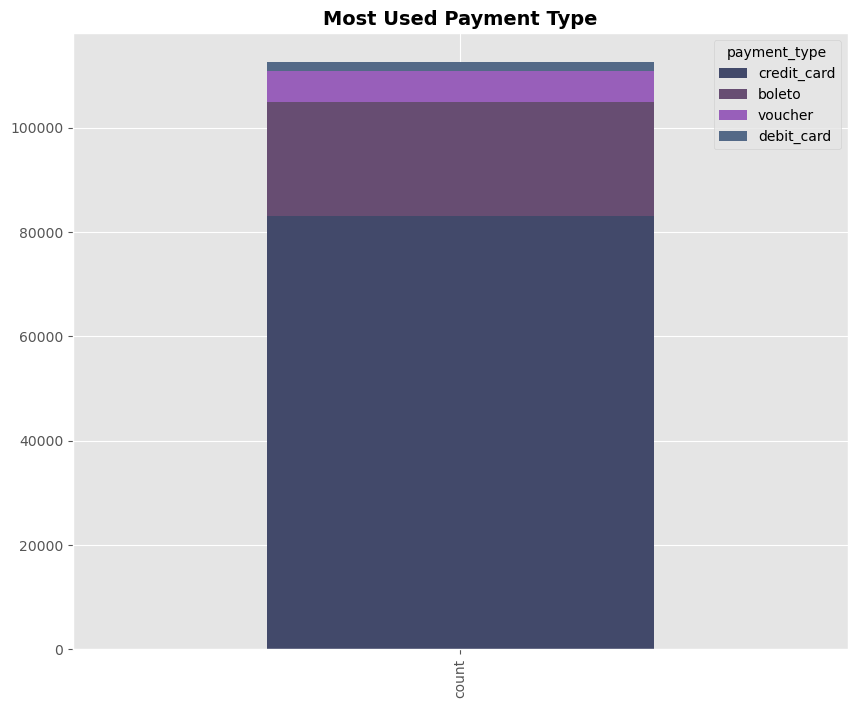

In [39]:
# Create a DataFrame where each row corresponds to a payment and each column corresponds to a payment type
payment_counts = df_payment['payment_type'].value_counts()
payment_df = pd.DataFrame(payment_counts).T  # Transpose the DataFrame

# Generate colors from the 'rocket' colormap
colors = ['#42496a', '#674d72', '#985fba', '#536987']

# Create a stacked bar chart with specified size
payment_df.plot(kind='bar', stacked=True, color=colors, figsize=(10,8))

plt.title('Most Used Payment Type', weight='bold', size=14)

plt.show()

- Dari data yang disajikan, terlihat bahwa metode pembayaran yang paling sering digunakan oleh para pelanggan adalah kartu kredit (Credit Card) dan Boleto. Menyediakan kedua metode pembayaran ini di platform E-Commerce dapat meningkatkan daya tarik dan kenyamanan pelanggan dalam bertransaksi.  Penjual harus memastikan bahwa kedua metode pembayaran ini tersedia dan mudah diakses di platform E-Commerce mereka. Dengan cara ini, mereka dapat meningkatkan kemungkinan konversi dan memperluas pangsa pasar dengan menyediakan opsi pembayaran yang sesuai dengan preferensi pelanggan. Selain itu, para penjual juga dapat mempertimbangkan untuk menawarkan insentif atau diskon khusus untuk penggunaan metode pembayaran tertentu (yang paling sering digunakan) guna mendorong keuntungan.


Note:
- Proses pembayaran transaksi boleto bancário serupa dengan metode pembayaran wire transfer atau tunai. Pelanggan diberikan slip pembayaran boleto bancário yang telah diisi sebelumnya. Pada titik ini, pelanggan memiliki pilihan untuk mencetak formulir dan membayarnya secara fisik di cabang bank mana pun atau di pemroses resmi seperti toko obat, supermarket, agen lotere, dan kantor pos. Selain itu, pembayaran juga dapat dilakukan secara elektronik di lebih dari 48.000 ATM di Brasil, serta melalui internet banking.
- https://www.pagbrasil.com/payment-methods/boleto-bancario/

### Product and Payment

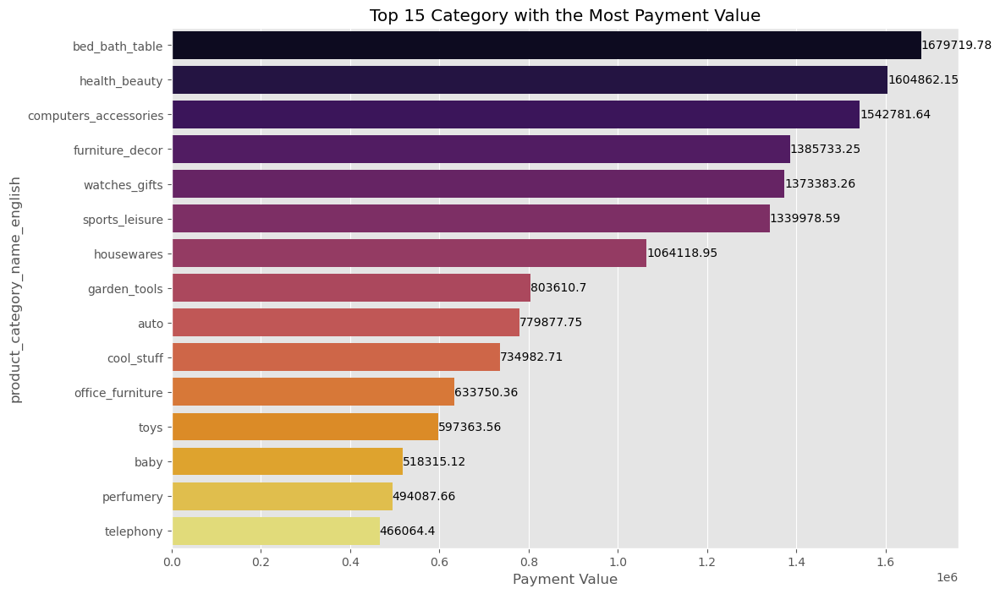

In [40]:
# Top 10 Category with the Most Payment Value
top_15_category = df_new.groupby('product_category_name_english')['payment_value'].sum().round(2).sort_values(ascending=False).head(15)

# Plot
plt.figure(figsize=(12,8))
sns.barplot(x=top_15_category.values, y=top_15_category.index, palette='inferno')
plt.title('Top 15 Category with the Most Payment Value')
plt.xlabel('Payment Value')

# Annotate each bar
for i, v in enumerate(top_15_category.values):
    plt.text(v, i, str(v), ha='left', va='center')
    
plt.show()

In [41]:
# Step 2: Group the data by 'payment_type' and 'product_category_name_english' and calculate the sum of the 'payment_value' and the count of the orders
grouped = df_payment.groupby(['payment_type', 'product_category_name_english']).agg({'payment_value': 'sum', 'order_count': 'sum', 'payment_installments': 'mean'})

In [42]:
# sort the data by the order count for each payment type in descending order
grouped.sort_values(['payment_type', 'order_count'], ascending=[True, False])

payment_value  order_count  \
payment_type product_category_name_english                                   
boleto       computers_accessories                  553853.31         2093   
             bed_bath_table                         255898.59         1847   
             health_beauty                          269501.16         1798   
             sports_leisure                         245723.37         1725   
             furniture_decor                        298475.41         1705   
...                                                       ...          ...   
voucher      cine_photo                                 44.12            2   
             furniture_mattress_and_upholstery          75.00            2   
             la_cuisine                                200.00            2   
             fashion_female_clothing                    78.70            1   
             fashion_sport                              75.07            1   

                                                payment_installments  
payment_type product_category_name_english                            
boleto       computers_accessories                               1.0  
             bed_bath_table                                      1.0  
             health_beauty                                       1.0  
             sports_leisure                                      1.0  
             furniture_decor                                     1.0  
...                                                              ...  
voucher      cine_photo                                          1.0  
             furniture_mattress_and_upholstery                   1.0  
             la_cuisine                                          1.0  
             fashion_female_clothing                             1.0  
             fashion_sport                                       1.0  

[256 rows x 3 columns]

Beberapa kategori produk, seperti Bed Bath Table, Health & Beauty, Computers & Accessories, Furniture, Watches & Gifts, Sports & Leisure, dan Housewares, memberikan kontribusi terbesar terhadap pendapatan. Hal ini menunjukkan pentingnya penjual memahami kontribusi relatif dari setiap kategori produk terhadap pendapatan keseluruhan mereka. 

Fokus pada penjualan produk-produk dengan nilai transaksi yang tinggi dapat membantu meningkatkan pendapatan dan profitabilitas. Namun, penjual juga perlu mempertimbangkan diversifikasi produk untuk mengurangi risiko dan meningkatkan potensi pendapatan jangka panjang. Ini bisa dilakukan dengan mengeksplorasi peluang dalam kategori produk lain yang mungkin tidak sepopuler, tetapi masih memiliki potensi pertumbuhan. 

Tindakan yang dapat diambil oleh penjual adalah untuk menyusun strategi penjualan yang berfokus pada produk-produk dengan nilai transaksi tinggi, sambil tetap memperhatikan diversifikasi produk untuk memaksimalkan pendapatan dan memperluas pangsa pasar mereka. Selain itu, menyediakan informasi tentang jenis barang yang dipesan berdasarkan metode pembayaran dapat membantu penjual dalam memahami preferensi pembayaran pelanggan dan menyesuaikan strategi penjualan mereka secara lebih efektif.

### Payment Value and Freight

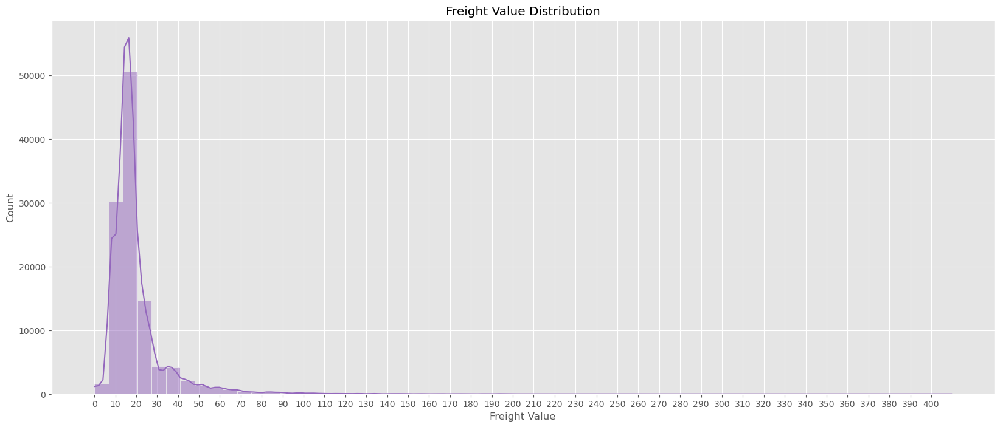

In [43]:
# Freights value distribution
plt.figure(figsize=(20,8))
sns.histplot(df_new['freight_value'], kde=True, color='tab:purple', bins=60)
plt.title('Freight Value Distribution')
plt.xlabel('Freight Value')

# Specify the locations and labels of the x-ticks
plt.xticks(np.arange(0, df_new['freight_value'].max(), step=10))

plt.show()

Dari analisis yang dilakukan, terlihat bahwa sebagian besar pesanan memiliki **biaya pengiriman (ongkir) dalam kisaran 10 - 20 Real Brasil**. Hal ini menunjukkan bahwa para pelanggan cenderung menganggap nilai ini sebagai standar atau normal dalam hal biaya pengiriman. Para penjual dapat menggunakan informasi ini untuk merancang promosi potongan ongkir yang menarik bagi pelanggan, misalnya dengan menawarkan potongan ongkir untuk pembelian di atas nilai tertentu atau dengan menyesuaikan biaya pengiriman agar berada dalam kisaran yang lebih diminati oleh pelanggan. Dengan demikian, penjual dapat meningkatkan daya tarik penawaran mereka dan mendorong pelanggan untuk melakukan pembelian dengan nilai yang lebih tinggi, sambil tetap memberikan kepuasan dalam hal biaya pengiriman yang wajar.

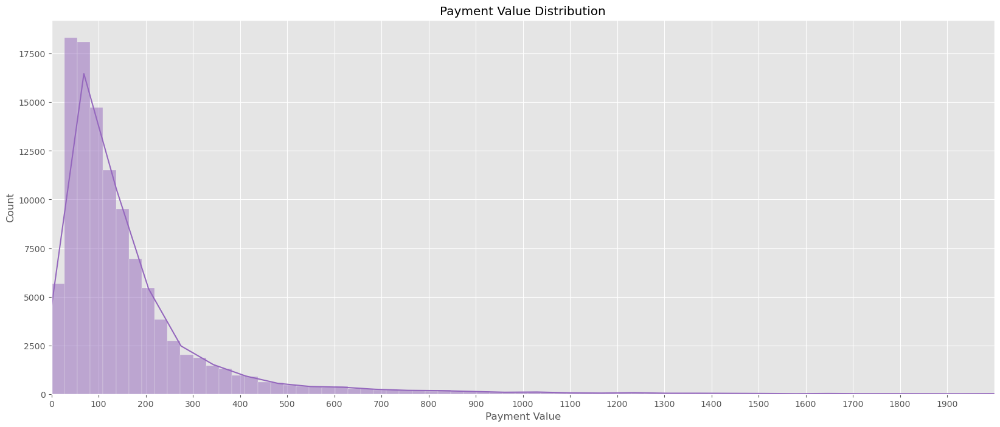

In [44]:
# Payment value distribution
plt.figure(figsize=(20,8))
sns.histplot(df_new['payment_value'], kde=True, color='tab:purple', bins=500)
plt.title('Payment Value Distribution')
plt.xlabel('Payment Value')

# Specify the locations and labels of the x-ticks
plt.xticks(np.arange(0, 2000, step=100))

# Limit the x-axis to 2000
plt.xlim([0, 2000])

plt.show()

**Mayoritas pembayaran yang dilakukan oleh pelanggan berada dalam kisaran 50 hingga 200 Real Brasil**. Ini menunjukkan pola pembayaran yang umum di platform e-commerce tersebut. Mencapai milestone pembayaran bulanan dapat menjadi strategi yang efektif dalam meningkatkan keterlibatan pelanggan dan pendapatan merchant. Misalnya, dengan menetapkan milestone untuk total pembelanjaan bulanan sebesar 150 hingga 300 Real Brasil, pelanggan yang mencapai milestone tersebut dapat diberikan insentif seperti diskon atau voucher potongan ongkir. 

Tindakan yang dapat diambil adalah untuk merancang program loyalitas yang menarik bagi pelanggan, dengan menetapkan milestone pembayaran yang dapat dicapai secara rutin. Hal ini dapat mendorong pelanggan untuk melakukan pembelian secara konsisten, meningkatkan loyalitas pelanggan, dan pada gilirannya, meningkatkan pendapatan merchant. Dengan memahami pola pembayaran dan perilaku pelanggan, penjual dapat mengoptimalkan strategi pemasaran dan promosi untuk meningkatkan keterlibatan pelanggan dan pendapatan mereka.

## Delivery Time Analysis

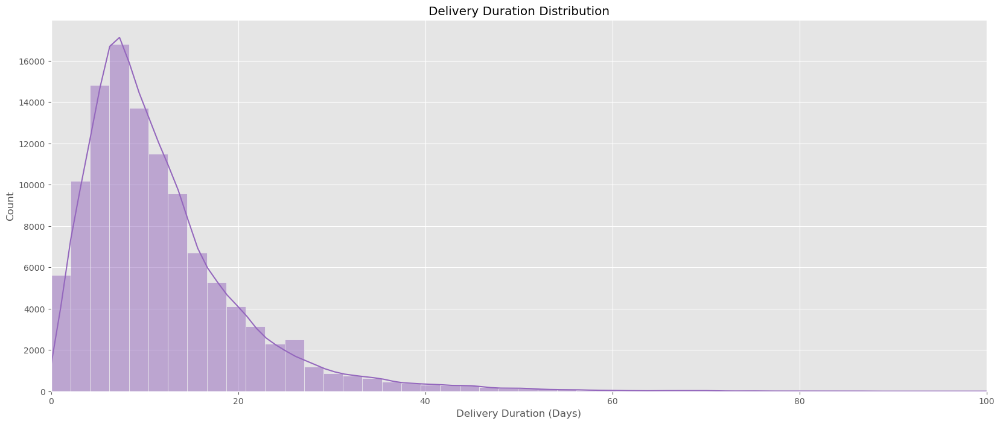

In [45]:
# delivery_duration value distribution
plt.figure(figsize=(20,8))
sns.histplot(df_new['delivery_duration'], kde=True, color='tab:purple', bins=100)
plt.title('Delivery Duration Distribution')
plt.xlabel('Delivery Duration (Days)')

# Limit the x-axis to 2000
plt.xlim([0, 100])

plt.show()

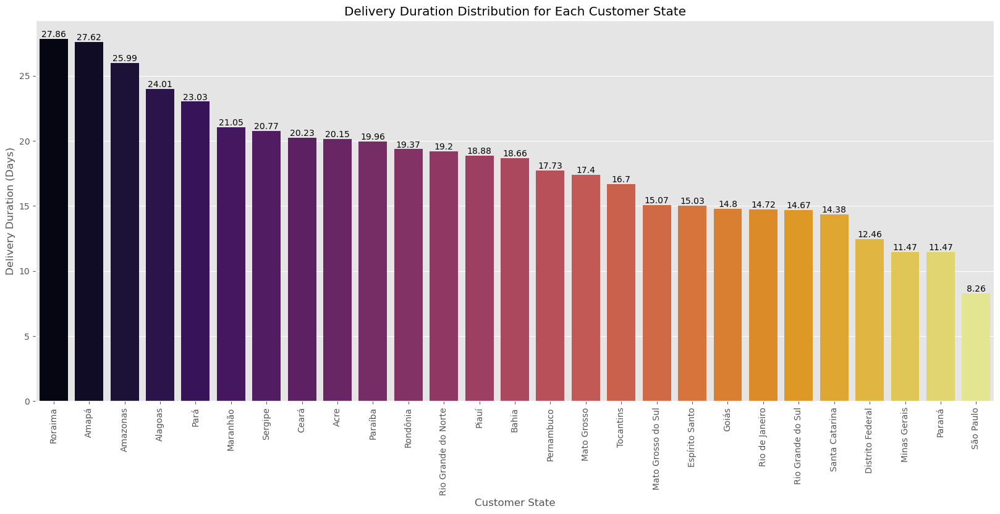

In [46]:
#Delivery duration distribution for each customer state
df_delivery = df_new[['customer_state', 'delivery_duration']]

df_delivery_grouped = df_delivery.groupby('customer_state')['delivery_duration'].mean().sort_values(ascending=False)

# Plot
plt.figure(figsize=(20,8))
sns.barplot(x=df_delivery_grouped.index, y=df_delivery_grouped.values, palette='inferno')
plt.title('Delivery Duration Distribution for Each Customer State')
plt.xlabel('Customer State')
plt.ylabel('Delivery Duration (Days)')

# Annotate each bar
for i, v in enumerate(df_delivery_grouped.values):
    plt.text(i, v, str(round(v, 2)), ha='center', va='bottom')
    
#Rotate x-labels 45 degrees
plt.xticks(rotation=90)

plt.show()

- Terdapat variasi waktu pengiriman barang di berbagai negara bagian Brasil, dengan waktu **pengiriman terlama umumnya berada dalam rentang 5-10 hari.**
- Lima negara bagian dengan waktu pengiriman rata-rata terlama adalah Roraima, Amapá, Amazonas, Alagoas, dan Pará, yang secara geografis berada di utara Brasil.
- Faktor-faktor seperti infrastruktur logistik yang terbatas dan aksesibilitas yang rendah dapat menjadi penyebab utama dari waktu pengiriman yang lebih lama di wilayah-wilayah tersebut. Hal ini menunjukkan bahwa para seller perlu memperhatikan estimasi waktu pengiriman dan memperkuat infrastruktur logistik mereka di daerah-daerah dengan waktu pengiriman yang lebih lama untuk memenuhi ekspektasi pelanggan dan meningkatkan kepuasan mereka. Selain itu, para seller juga dapat mempertimbangkan untuk memperluas jangkauan mereka ke wilayah-wilayah ini atau menjalin kerjasama dengan penyedia layanan logistik lokal untuk meningkatkan efisiensi pengiriman dan mengurangi waktu pengiriman barang.

## RFM Analysis

Analisis RFM (Recency, Frequency, Monetary) adalah teknik pemasaran yang digunakan untuk menentukan peringkat dan mengelompokkan pelanggan secara kuantitatif. Dalam menentukan segmentasi pelanggan, digunakan model RFM berdasarkan tiga variabel yaitu:

- **Recency**: terakhir kali pelanggan melakukan transaksi
- **Frequency**: frekuensi transaksi dari setiap pelanggan
- **Monetary**: jumlah pengeluaran setiap pelanggan

**Notes**:

**`RFM Analysis hanya kami gunakan pada EDA saja & tidak akan kami gunakan ke dalam permodelan Machine Learning, karena model kami hanya akan berfokus pada keuntungan Merchant bukan untuk menganalisis Customer`.**

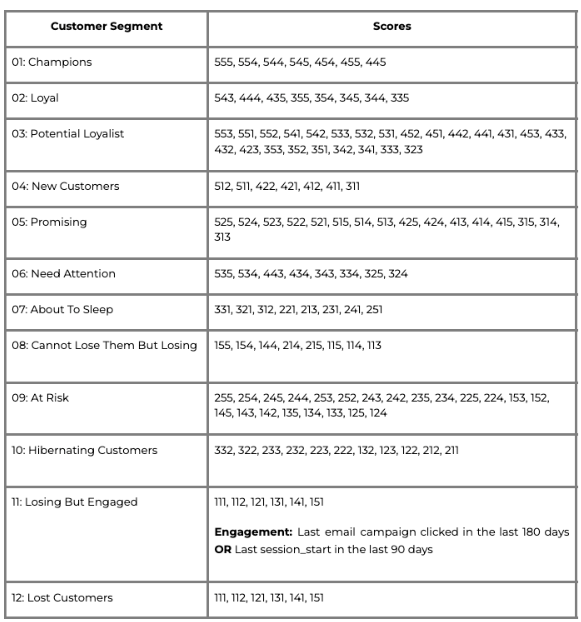

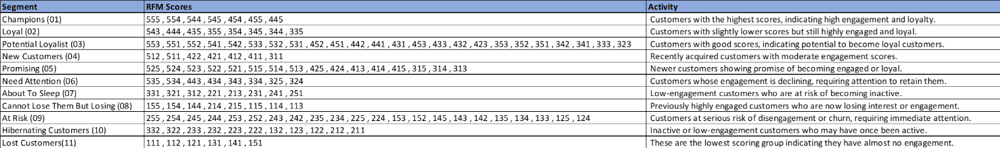

**Source**: https://documentation.bloomreach.com/engagement/docs/rfm-segmentation

In [47]:
# Create RFM Table
# Recency: Latest date - Last purchase date
# Frequency: Count of order_id
# Monetary: Sum of payment_value

# Step 1: Create a new DataFrame
df_rfm = df_new[['customer_unique_id', 'order_purchase_timestamp', 'order_id', 'payment_value']]

# Step 2: Calculate the RFM metrics
rfm = df_rfm.groupby('customer_unique_id').agg({'order_purchase_timestamp': lambda date: (df_rfm['order_purchase_timestamp'].max() - date.max()).days,
                                                'order_id': 'count',
                                                'payment_value': 'sum'}).round(2)

# Step 3: Rename the columns
rfm.rename(columns={'order_purchase_timestamp': 'Recency',
                    'order_id': 'Frequency',
                    'payment_value': 'Monetary'}, inplace=True)

rfm.head()

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19
0000f46a3911fa3c0805444483337064,536,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62
0004aac84e0df4da2b147fca70cf8255,287,1,196.89


In [48]:
# Create Recency Score, Frequency Score, and Monetary Score
# Recency: The lower the value, the better
# Frequency and Monetary: The higher the value, the better

# Step 1: Create a new DataFrame
rfm_score = rfm.copy()

rfm_score["recency_score"]  = pd.qcut(rfm_score['Recency'], 5, labels=[5, 4, 3, 2, 1])
rfm_score["frequency_score"]= pd.qcut(rfm_score['Frequency'].rank(method="first"), 5, labels=[1, 2, 3, 4, 5])
rfm_score["monetary_score"] = pd.qcut(rfm_score['Monetary'], 5, labels=[1, 2, 3, 4, 5])

In [49]:
rfm_score.head()

,Recency,Frequency,Monetary,recency_score,frequency_score,monetary_score
customer_unique_id,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,4,1,4
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,4,1,1
0000f46a3911fa3c0805444483337064,536,1,86.22,1,1,2
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,2,1,1
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,2,1,4


In [50]:
# Calculate RFM Score
rfm_score['RFM_Score'] = rfm_score['recency_score'].astype(str) + rfm_score['frequency_score'].astype(str) + rfm_score['monetary_score'].astype(str)

rfm_score.head()

,Recency,Frequency,Monetary,recency_score,frequency_score,monetary_score,RFM_Score
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,4,1,4,414
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,4,1,1,411
0000f46a3911fa3c0805444483337064,536,1,86.22,1,1,2,112
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,2,1,1,211
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,2,1,4,214


In [51]:
seg_map= {
    r'111|112|121|131|141|151': 'Lost customers',
    r'332|322|233|232|223|222|132|123|122|212|211': 'Hibernating customers', 
    r'155|154|144|214|215|115|114|113': 'Cannot Lose Them',
    r'255|254|245|244|253|252|243|242|235|234|225|224|153|152|145|143|142|135|134|133|125|124': 'At Risk',
    r'331|321|312|221|213|231|241|251': 'About To Sleep',
    r'535|534|443|434|343|334|325|324': 'Need Attention',
    r'525|524|523|522|521|515|514|513|425|424|413|414|415|315|314|313': 'Promising',
    r'512|511|422|421|412|411|311': 'New Customers',
    r'553|551|552|541|542|533|532|531|452|451|442|441|431|453|433|432|423|353|352|351|342|341|333|323': 'Potential Loyalist',
    r'543|444|435|355|354|345|344|335': 'Loyal',
    r'555|554|544|545|454|455|445': 'Champions'
}

# Map the 'RFM_Segment' with the 'seg_map' dictionary according to RFM_Score column
rfm_score['RFM_Segment'] = rfm_score['RFM_Score'].replace(seg_map, regex=True)

In [52]:
avg_review_score = df_new.groupby('customer_unique_id')['review_score'].mean()

rfm_score = rfm_score.join(avg_review_score)

In [53]:
rfm_score.head()

,Recency,Frequency,Monetary,recency_score,frequency_score,monetary_score,RFM_Score,RFM_Segment,review_score
customer_unique_id,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,4,1,4,414,Promising,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,4,1,1,411,New Customers,4.0
0000f46a3911fa3c0805444483337064,536,1,86.22,1,1,2,112,Lost customers,3.0
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,2,1,1,211,Hibernating customers,4.0
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,2,1,4,214,Cannot Lose Them,5.0


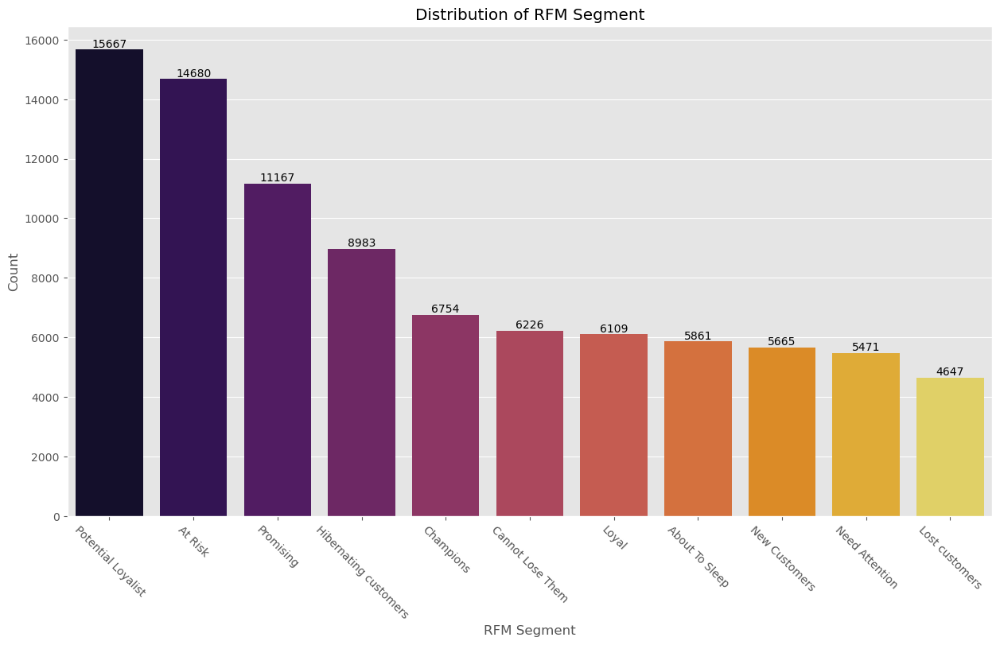

In [54]:
# Distribution of RFM Segment
plt.figure(figsize=(15,8))
sns.countplot(x='RFM_Segment', data=rfm_score, palette='inferno', order = rfm_score['RFM_Segment'].value_counts().index)
plt.title('Distribution of RFM Segment')
plt.xlabel('RFM Segment')
plt.ylabel('Count')

# Get the counts in the same order as the RFM segments
counts = rfm_score['RFM_Segment'].value_counts()

# Annotate each bar
for i, v in enumerate(counts):
    plt.text(i, v, str(v), ha='center', va='bottom')

# Rotate the x-axis labels to 45 degrees
plt.xticks(rotation=-45)
    
plt.show()

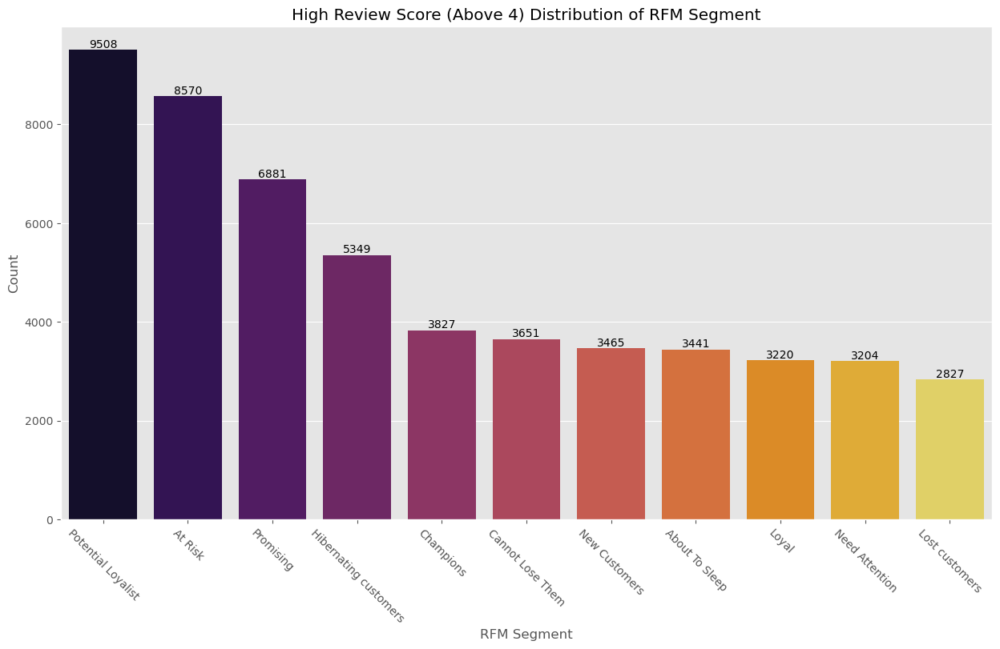

In [55]:
# Filter for reviews of 4 and 5
high_reviews = rfm_score[rfm_score['review_score'] > 4]

# Count the number of occurrences for each segment
segment_counts = high_reviews['RFM_Segment'].value_counts()

# Sort the counts
sorted_segment_counts = segment_counts.sort_values(ascending=False)

# make bar plot
plt.figure(figsize=(15,8))
sns.barplot(x=sorted_segment_counts.index, y=sorted_segment_counts.values, palette='inferno')
plt.title('High Review Score (Above 4) Distribution of RFM Segment')
plt.xlabel('RFM Segment')
plt.ylabel('Count')

#annotate each bar
for i, v in enumerate(sorted_segment_counts):
    plt.text(i, v, str(v), ha='center', va='bottom')
    
# Rotate the x-axis labels to 45 degrees
plt.xticks(rotation=-45)

plt.show()


- Berdasarkan Analisa RFM, kita memiliki `sangat banyak customer yang berpotensial menjadi pelanggan setia`, `tetapi disaat yang bersamaan kita juga mendapati bahwa banyak juga customer yang berpotensi untuk churn`.
- Jika melihat berdasarkan **Review Score**, `Potential Loyalist` cenderung **lebih sering** memberikan review score `lebih dari 4` dan `Lost Costumer` **lebih jarang** memberikan Review Score `lebih dari 4`. Hal ini menandakan bahwa memang **Potential Loyalist** merasa puas berbelanja di store - store yang ada di Olist sedangkan **Lost Customer** tidak.
- Sedangkan untuk `At Risk`, sebenarnya mereka `cenderung memberikan review yang bagus terhadap store - store di Olist`, tetapi `mungkin memang tidak terlalu sering melakukan transaksi`, sehingga masih `ada harapan untuk membuat customer yang berada di segment ini berbalik lagi untuk berbelanja di Olist` dengan melakukan metode `re-engagement` seperti pemberian promo dan lain sebagainya.
- Maka ada baiknya untuk berfokus pada kedua segment ini, tanpa sepenuhnya mengabaikan segment yang lain

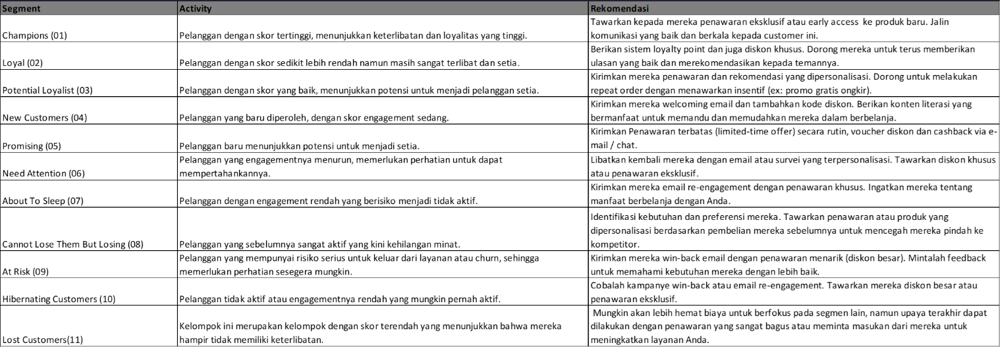

## EDA Summary
Dalam analisis yang dilakukan terhadap dataset Olist, kami telah menyelidiki beragam aspek yang mencakup demografi pelanggan, karakteristik pesanan dan produk, perilaku pembelian dari waktu ke waktu, pola pembayaran dan pengiriman, serta segmentasi customer menggunakan rfm. Berikut merupakan gambaran tentang pasar e-commerce Olist di Brazil serta rekomendasi untuk para seller dalam mengoptimalkan penjualan mereka:

1. **Understanding Customer Demographics:**
   - **Top State:** Sao Paulo (SP) merupakan state dengan jumlah pembelanjaan online terbanyak di Brazil diikuti oleh Rio de Janeiro (RJ) hal ini dikarenakan mereka merupakan kota metropolitan yang paling kaya dan memiliki tingkat GRP yang tinggi.
   - **Top City:** Kota Sao Paulo (SP), Rio de Janeiro (RJ), dan Belo Horizonte (MG) merupakan kota yang memiliki jumlah order terbanyak. Oleh karena itu, penjual perlu mengembangkan strategi tambahan, seperti memasarkan produk kepada segmen pasar tertentu atau melakukan diferensiasi produk, untuk tetap bersaing secara efektif.
   - Sebagai referensi, produk paling populer yang laris terjual di SP adalah Bed Bath Table, Health & beauty, Sports & Leisure, Furniture, Housewares, dan Computers & Accessories.
   - Faktor-faktor seperti keberagaman ekonomi, infrastruktur digital yang baik, kehidupan urban yang aktif, dan promosi dan penawaran khusus yang menarik banyak pelanggan untuk melakukan pembelian online.
   - Dengan memahami demografi pelanggan dan produk yang populer, informasi ini dapat dijadikan sebagai acuan sederhana bagi para seller pada masing-masing wilayah dalam memilih produk yang ingin dipasarkan sesuai dengan preferensi produknya masing-masing.

2. **Analyzing Order and Product Characteristics:**
   - Karakteristik produk seperti Harga dan Berat produk memiliki korelasi positif terhadap revenue. 
   - Deskripsi produk yang mendetail juga memiliki dampak signifikan terhadap pendapatan, sementara Review Score menunjukkan korelasi negatif.
   - Dengan memahami korelasi ini, dapat membantu mengoptimalkan daftar produk dan meningkatkan revenue.

3. **Exploring Purchase Behavior Over Time:**
    - Bulan **Mei sampai Agustus** merupakan peak season untuk pembelian, hal ini dapat dipengaruhi oleh jadwal akademik dan acara/ event budaya.
   - Pada weekdays terjadi aktivitas belanja yang lebih tinggi, terutama mulai pukul 10.00 hingga 22.00.
   - Acara khusus seperti Black Friday (24 November 2017) dapat menarik banyak pembeli dan meningkatkan volume pesanan secara signifikan. Pentingnya melakukan promosi yang tepat sasaran pada waktu yang tepat untuk meningkatkan penjualan

4. **Payment & Freight:**
   - **Payment Type:** Credit Card dan Boleto paling sering digunakan oleh customer.
   - Mayoritas orderan memiliki ongkir 10-20 Real Brazil dengan payment valuenya mayoritas berada di 50-200 Real Brazil.
   - Kebutuhan pembelanjaan yang berpengaruh terhadap pendapatan adalah cost pengiriman, strategi penjualan terhadap produk dengan nilai transaksi tinggi, diversifikasi produk, dan eksplorasi peluang di kategori produk lain.
   - Dapat dilakukan strategi penjualan untuk menarik pelanggan dan meningkatkan revenue seperti, menawarkan potongan ongkir untuk minimal pembelian tertentu atau diskon untuk total pembelanjaan 150-300 Real.

5. **Delivery Time Analysis:**
   - **Delivery Time:** 5 - 10 hari.
   - Waktu pengiriman barang terlama terjadi di negara bagian di bagian utara Brasil [Roraima (RR), Amapá (AP), Amazonas (AM), Alagoas (AL), dan Pará (PA)]. Hal ini menunjukkan perlunya penyesuaian dalam manajemen pengiriman dan penyediaan opsi pengiriman yang lebih cepat bagi pelanggan di wilayah tersebut.

6. **RFM Analysis:**
   - Analisis RFM menunjukkan bahwa banyak pelanggan berpotensi menjadi setia, tetapi juga ada yang berpotensi untuk churn. 
   - Fokus pada segment Potensial Loyalist dan At Risk, tetapi tetap perhatikan juga Lost Customers dan New Customers. Tawarkan promo khusus bagi pelanggan At Risk dan program loyalitas untuk Potensial Loyalist guna meningkatkan loyalitas dan mencegah churn, serta lakukan analisis RFM berkala untuk menyesuaikan strategi pemasaran yang efektif.